### Student number: 40462364
### Name:           Imama Jawad
### Course:         ECS805
### Date:           28/03/2024
### By submitting the work, I declare that:
1. I have read and understood the University regulations relating to academic offences, including collusion and
plagiarism:
http://www.qub.ac.uk/directorates/AcademicStudentAffairs/AcademicAffairs/GeneralRegulations/Procedures/P
roceduresforDealingwithAcademicOffences/
2. The submission is my own original work and no part of it has been submitted for any other assignments,
except as otherwise permitted.
3. All sources used, published or unpublished, have been acknowledged.
4. I give my consent for the work to be scanned using a plagiarism detection software.


# Library Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA, NMF, KernelPCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, RandomForestRegressor
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression, BayesianRidge
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from xgboost import XGBClassifier
from sklearn.datasets import load_iris
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from mpl_toolkits.mplot3d import Axes3D
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from collections import defaultdict

# Install additional libraries (if not already installed)
!pip install sweetviz ydata-profiling

# Comprehensive EDA Report
from ydata_profiling import ProfileReport


In [2]:

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


/kaggle/input/paccanatlas/PanCanAtlas_9126RNASeqSamplesWithImmuneSubtypes_440Genes_SampleIdsOrdered_SampleIdWithSubtypes_RR020718_RownamesGenesWithSignature.csv
/kaggle/input/paccanatlas/1-s2.0-S1074761318301213-mmc2.xlsx
/kaggle/input/ai-for-health2/Groups_7302_80Percent_from_Original.csv
/kaggle/input/ai-for-health2/EBPlusPlusAdjustPANCAN_IlluminaHiSeq_RNASeqV2.geneExp.tsv


# Section 1- Data Preparation and Pre-processing
Objective: Prepare the RNA-seq and immune subtype data by cleaning, filtering, and normalizing the datasets.


In [3]:
# Immune Subtypes Dataset
file_pathcolumns = "/kaggle/input/paccanatlas/PanCanAtlas_9126RNASeqSamplesWithImmuneSubtypes_440Genes_SampleIdsOrdered_SampleIdWithSubtypes_RR020718_RownamesGenesWithSignature.csv"

df=pd.read_csv(file_pathcolumns,index_col=0)
df_T = df.T
df_T.head()

,ACTL6A_S5,ADAM9_S2,ADAMTS1_S5,ADCY7_S3,AIMP2_S5,ALKBH7_S5,ALOX5AP_S3,AMPD3_S3,APITD1_S5,APOC1_S3,...,VTA1_S5,WDHD1_S5,WDR54_S5,WDR77_S5,WIPF1_S3,WNT2B_S2,WNT8B_S2,WSB2_S5,ZWILCH_S5,ZYX_S2
TCGA.02.0047.GBM.C4,745.567,4287.78,241.556,1067.640,406.736,518.148,1326.410,326.992,184.308,1370.66,...,1230.52,107.5630,321.460,925.044,2154.950,43.0253,0.0000,4291.47,260.211,3867.97
TCGA.02.0055.GBM.C4,1154.310,9475.54,6098.950,556.132,537.088,942.957,4211.350,361.598,319.535,3093.48,...,1183.46,162.5790,585.844,931.184,1947.580,44.8493,0.0000,2494.18,467.560,11481.40
TCGA.02.2483.GBM.C4,1498.680,2307.12,433.984,497.309,752.148,656.042,566.543,196.728,311.443,3504.38,...,1514.30,267.2300,561.055,1370.770,1042.740,10.1319,0.8443,4128.76,682.242,5066.81
TCGA.02.2485.GBM.C4,1320.000,2685.71,911.905,316.667,785.552,953.809,307.143,80.000,260.462,2482.86,...,1577.62,309.5240,422.381,811.905,849.524,18.5714,0.9524,3609.52,440.386,5090.95
TCGA.02.2486.GBM.C4,1404.270,2843.90,321.951,637.805,792.963,815.244,5671.950,542.683,494.488,12512.80,...,1484.76,45.7317,669.512,954.878,2454.880,7.3171,0.6098,2747.56,166.689,7800.00


In [4]:
print(df_T.shape[0],"Rows-",df_T.shape[1],"Columns" )

9126 Rows- 440 Columns


In [5]:
# Original Whole Tsv dataset unfiltered
file_geneexpressions = "/kaggle/input/ai-for-health2/EBPlusPlusAdjustPANCAN_IlluminaHiSeq_RNASeqV2.geneExp.tsv"

df_geneExpressions=pd.read_csv(file_geneexpressions, sep="\t",index_col=0)

df_geneExpressions_T=df_geneExpressions.T
df_geneExpressions_T.head()

gene_id,?|100130426,?|100133144,?|100134869,?|10357,?|10431,?|136542,?|155060,?|26823,?|280660,?|317712,...,ZWILCH|55055,ZWINT|11130,ZXDA|7789,ZXDB|158586,ZXDC|79364,ZYG11A|440590,ZYG11B|79699,ZYX|7791,ZZEF1|23140,ZZZ3|26009
TCGA-OR-A5J1-01A-11R-A29S-07,0.0,3.2661,3.9385,149.1350,2034.10,0.0,274.255,1.4409,0.0,0.0,...,183.9580,146.9740,20.6532,351.585,1050.910,0.4803,648.415,1841.020,1157.540,596.062
TCGA-OR-A5J2-01A-11R-A29S-07,0.0,2.6815,8.9948,81.0777,1304.93,0.0,199.302,0.0000,0.0,0.0,...,264.1250,438.4640,57.1735,279.023,2979.870,31.4052,1166.020,3059.990,1895.990,801.637
TCGA-OR-A5J3-01A-11R-A29S-07,0.0,1.7301,6.5650,86.4879,1054.66,0.0,348.393,0.5925,0.0,0.0,...,90.6532,190.1940,39.6978,495.334,914.827,0.5925,806.399,2655.610,1482.450,437.269
TCGA-OR-A5J5-01A-11R-A29S-07,0.0,0.0000,1.5492,53.9117,2350.89,0.0,439.194,0.7746,0.0,0.0,...,260.2630,840.4340,17.8156,206.042,890.782,11.6189,553.834,2367.930,1140.200,512.781
TCGA-OR-A5J6-01A-31R-A29S-07,0.0,0.0000,4.4709,66.9063,1257.99,0.0,149.215,0.0000,0.0,0.0,...,64.2685,63.1508,12.8537,117.919,894.730,7.8240,795.812,708.071,796.371,475.587


In [6]:
print(df_geneExpressions_T.shape[0],"Rows,",df_geneExpressions_T.shape[1],"Columns")

11069 Rows, 20531 Columns


In [7]:
df_T.columns

Index(['ACTL6A_S5', 'ADAM9_S2', 'ADAMTS1_S5', 'ADCY7_S3', 'AIMP2_S5',
       'ALKBH7_S5', 'ALOX5AP_S3', 'AMPD3_S3', 'APITD1_S5', 'APOC1_S3',
       ...
       'VTA1_S5', 'WDHD1_S5', 'WDR54_S5', 'WDR77_S5', 'WIPF1_S3', 'WNT2B_S2',
       'WNT8B_S2', 'WSB2_S5', 'ZWILCH_S5', 'ZYX_S2'],
      dtype='object', length=440)

In [8]:
df_geneExpressions_T.columns

Index(['?|100130426', '?|100133144', '?|100134869', '?|10357', '?|10431',
       '?|136542', '?|155060', '?|26823', '?|280660', '?|317712',
       ...
       'ZWILCH|55055', 'ZWINT|11130', 'ZXDA|7789', 'ZXDB|158586', 'ZXDC|79364',
       'ZYG11A|440590', 'ZYG11B|79699', 'ZYX|7791', 'ZZEF1|23140',
       'ZZZ3|26009'],
      dtype='object', name='gene_id', length=20531)

## Extracting genotypes information relevant to immune subtype sampling

In [9]:
#Filter the columns found in df_T in the tsv to extract genes relevant to immune subtype genes
#Extract prefixes before '|' from df_geneExpressions_T columns
prefixes_df1 = df_geneExpressions_T.columns.str.split('|').str[0]

# Extract prefixes before '_' from df_T columns
prefixes_df2 = df_T.columns.str.split('_').str[0]

# Find the common prefixes
common_prefixes = prefixes_df1.intersection(prefixes_df2)

# Filter df_geneExpressions_T to keep only matching columns
df_filtered = df_geneExpressions_T.loc[:, prefixes_df1.isin(common_prefixes)]

# Rename df_filtered columns to match naming convention from df_T
rename_mapping = {col: df_T.columns[prefixes_df2 == col.split('|')[0]].values[0] for col in df_filtered.columns}
df_filtered = df_filtered.rename(columns=rename_mapping)


In [10]:
df_filtered.head()

gene_id,ACTL6A_S5,ADAM9_S2,ADAMTS1_S5,ADCY7_S3,AIMP2_S5,ALKBH7_S5,ALOX5AP_S3,AMPD3_S3,APITD1_S5,APOC1_S3,...,VTA1_S5,WDHD1_S5,WDR54_S5,WDR77_S5,WIPF1_S3,WNT2B_S2,WNT8B_S2,WSB2_S5,ZWILCH_S5,ZYX_S2
TCGA-OR-A5J1-01A-11R-A29S-07,829.011,542.267,377.0410,183.477,338.823,974.544,83.5735,163.785,321.7190,1875.120,...,1124.880,64.3612,411.6230,951.489,571.086,11.5274,0.0000,1731.51,183.9580,1841.020
TCGA-OR-A5J2-01A-11R-A29S-07,935.310,1612.130,1453.5000,281.036,1001.020,812.508,9.2605,332.975,61.1998,237.552,...,1008.190,162.6630,64.0182,805.663,584.217,10.8710,0.4026,5007.11,264.1250,3059.990
TCGA-OR-A5J3-01A-11R-A29S-07,756.036,1101.470,777.9590,117.316,1081.980,1422.010,53.3254,347.208,210.2740,4049.180,...,537.994,183.6770,1183.8200,865.649,158.791,0.5925,3.5550,2508.67,90.6532,2655.610
TCGA-OR-A5J5-01A-11R-A29S-07,512.006,431.449,48.7994,333.075,198.474,1307.510,10.0697,115.414,208.9080,646.785,...,455.461,192.8740,509.6820,574.748,343.919,17.0411,0.7746,1889.23,260.2630,2367.930
TCGA-OR-A5J6-01A-31R-A29S-07,410.760,2296.900,310.7240,250.368,477.403,1442.970,326.3720,939.997,225.7780,79054.200,...,989.176,21.2366,483.9700,582.888,393.435,11.1771,0.0000,3739.87,64.2685,708.071


In [11]:
print("Rows:", df_filtered.shape[0], "Columns:" ,df_filtered.shape[1])

Rows: 11069 Columns: 440


## Extracting relevant subtypes for Samples C1 to C6

In [12]:
df_T.index

Index(['TCGA.02.0047.GBM.C4', 'TCGA.02.0055.GBM.C4', 'TCGA.02.2483.GBM.C4',
       'TCGA.02.2485.GBM.C4', 'TCGA.02.2486.GBM.C4', 'TCGA.04.1348.OV.C2',
       'TCGA.04.1357.OV.C2', 'TCGA.04.1362.OV.C4', 'TCGA.04.1364.OV.C1',
       'TCGA.04.1365.OV.C2',
       ...
       'TCGA.ZP.A9D2.LIHC.C2', 'TCGA.ZP.A9D4.LIHC.C4', 'TCGA.ZQ.A9CR.STAD.C1',
       'TCGA.ZR.A9CJ.ESCA.C1', 'TCGA.ZS.A9CD.LIHC.C3', 'TCGA.ZS.A9CE.LIHC.C4',
       'TCGA.ZS.A9CF.LIHC.C4', 'TCGA.ZS.A9CG.LIHC.C3', 'TCGA.ZU.A8S4.CHOL.C1',
       'TCGA.ZX.AA5X.CESC.C2'],
      dtype='object', length=9126)

In [13]:
df_filtered.index

Index(['TCGA-OR-A5J1-01A-11R-A29S-07', 'TCGA-OR-A5J2-01A-11R-A29S-07',
       'TCGA-OR-A5J3-01A-11R-A29S-07', 'TCGA-OR-A5J5-01A-11R-A29S-07',
       'TCGA-OR-A5J6-01A-31R-A29S-07', 'TCGA-OR-A5J7-01A-11R-A29S-07',
       'TCGA-OR-A5J8-01A-11R-A29S-07', 'TCGA-OR-A5J9-01A-11R-A29S-07',
       'TCGA-OR-A5JA-01A-11R-A29S-07', 'TCGA-OR-A5JB-01A-11R-A29S-07',
       ...
       'TCGA-CG-4449-01A-01R-1157-13', 'TCGA-CG-4462-01A-01R-1157-13',
       'TCGA-CG-4465-01A-01R-1157-13', 'TCGA-CG-4466-01A-01R-1157-13',
       'TCGA-CG-4469-01A-01R-1157-13', 'TCGA-CG-4472-01A-01R-1157-13',
       'TCGA-CG-4474-01A-02R-1157-13', 'TCGA-CG-4475-01A-01R-1157-13',
       'TCGA-CG-4476-01A-01R-1157-13', 'TCGA-CG-4477-01A-01R-1157-13'],
      dtype='object', length=11069)

In [14]:
# Extract first three segments from the index
df_filtered_index_trimmed = df_filtered.index.str.split('-').str[:3].str.join('-')
df_T_index_trimmed = df_T.index.str.split('.').str[:3].str.join('-')

# Subset df_filtered based on matching first three segments
df_filtered_subset = df_filtered.loc[df_filtered_index_trimmed.isin(df_T_index_trimmed)]


In [15]:
df_filtered_subset.head()

gene_id,ACTL6A_S5,ADAM9_S2,ADAMTS1_S5,ADCY7_S3,AIMP2_S5,ALKBH7_S5,ALOX5AP_S3,AMPD3_S3,APITD1_S5,APOC1_S3,...,VTA1_S5,WDHD1_S5,WDR54_S5,WDR77_S5,WIPF1_S3,WNT2B_S2,WNT8B_S2,WSB2_S5,ZWILCH_S5,ZYX_S2
TCGA-OR-A5J1-01A-11R-A29S-07,829.011,542.267,377.0410,183.477,338.823,974.544,83.5735,163.785,321.7190,1875.120,...,1124.880,64.3612,411.6230,951.489,571.086,11.5274,0.0000,1731.51,183.9580,1841.020
TCGA-OR-A5J2-01A-11R-A29S-07,935.310,1612.130,1453.5000,281.036,1001.020,812.508,9.2605,332.975,61.1998,237.552,...,1008.190,162.6630,64.0182,805.663,584.217,10.8710,0.4026,5007.11,264.1250,3059.990
TCGA-OR-A5J3-01A-11R-A29S-07,756.036,1101.470,777.9590,117.316,1081.980,1422.010,53.3254,347.208,210.2740,4049.180,...,537.994,183.6770,1183.8200,865.649,158.791,0.5925,3.5550,2508.67,90.6532,2655.610
TCGA-OR-A5J5-01A-11R-A29S-07,512.006,431.449,48.7994,333.075,198.474,1307.510,10.0697,115.414,208.9080,646.785,...,455.461,192.8740,509.6820,574.748,343.919,17.0411,0.7746,1889.23,260.2630,2367.930
TCGA-OR-A5J6-01A-31R-A29S-07,410.760,2296.900,310.7240,250.368,477.403,1442.970,326.3720,939.997,225.7780,79054.200,...,989.176,21.2366,483.9700,582.888,393.435,11.1771,0.0000,3739.87,64.2685,708.071


In [16]:
print(df_filtered_subset.shape[0],df_filtered_subset.shape[1])

9879 440


In [17]:
print(df_T.shape[0],df_T.shape[1])

9126 440


In [18]:
df_filtered_subset.index

Index(['TCGA-OR-A5J1-01A-11R-A29S-07', 'TCGA-OR-A5J2-01A-11R-A29S-07',
       'TCGA-OR-A5J3-01A-11R-A29S-07', 'TCGA-OR-A5J5-01A-11R-A29S-07',
       'TCGA-OR-A5J6-01A-31R-A29S-07', 'TCGA-OR-A5J7-01A-11R-A29S-07',
       'TCGA-OR-A5J8-01A-11R-A29S-07', 'TCGA-OR-A5J9-01A-11R-A29S-07',
       'TCGA-OR-A5JA-01A-11R-A29S-07', 'TCGA-OR-A5JB-01A-11R-A29S-07',
       ...
       'TCGA-CG-4449-01A-01R-1157-13', 'TCGA-CG-4462-01A-01R-1157-13',
       'TCGA-CG-4465-01A-01R-1157-13', 'TCGA-CG-4466-01A-01R-1157-13',
       'TCGA-CG-4469-01A-01R-1157-13', 'TCGA-CG-4472-01A-01R-1157-13',
       'TCGA-CG-4474-01A-02R-1157-13', 'TCGA-CG-4475-01A-01R-1157-13',
       'TCGA-CG-4476-01A-01R-1157-13', 'TCGA-CG-4477-01A-01R-1157-13'],
      dtype='object', length=9879)

### Extracting Primary solid tumors based on 01 in 4th component in sample TCGA Barcode 
The study is based only on primary solid tumors


In [19]:
# Extracting Primary solid tumors based on 01 in 4th component in sample TCGA Barcode as the study is based only on primary solid tumors
# Assuming df_filtered_subset.index is a list of row names
df_filtered_subset_index = df_filtered_subset.index  # Replace with your DataFrame index

# Sample valid row names

# Function to check if row name is valid
def is_valid_row_name(name):
    parts = name.split('-')
    if len(parts) > 3:  # Ensure the row name has enough parts
        number = parts[3][:2]  # Extract the 4th component and take the first two characters
        return number.isdigit() and  int(number)==1
    return False

# Filter valid row names
valid_rows = [name for name in df_filtered_subset_index if is_valid_row_name(name)]

# Check if row names in df_filtered_subset.index are in valid row names
rows_in_valid_names = [row for row in df_filtered_subset_index if row in valid_rows]

# Filter the DataFrame to include only the rows with valid row names
df_filtered_valid_rows = df_filtered_subset.loc[rows_in_valid_names]

# Show the filtered DataFrame
df_filtered_valid_rows.shape[0]


9130

## Handling Duplicate TCGA Samples

### General Rules for Selecting Representative Samples

When dealing with duplicate TCGA sample barcodes, we follow these selection rules:

1. **Primary tumor samples (01/TP) take priority** over other sample types.
2. **Metastatic samples (06/TM) are selected over additional metastatic (07/TAM)** when primary tumors are unavailable.
3. **If multiple primary tumor samples exist**, follow the BCR annotations to select the recommended sample.
4. **When BCR annotations are missing**, select the first available aliquot (`01R`) unless a specific second aliquot (`02R`) is chosen in BCR.

### Specific Recommendations for Our Cases

#### **1️⃣ TCGA-21-1076 (Both 01A Samples)**
- Both are **Primary Tumor (01/TP)**
- **Selection:** `TCGA-21-1076-01A-01R-0692-07`  
- **Rationale:** First aliquot (`01R`) is preferred when both are primary tumors.

#### **2️⃣ TCGA-06-0156 (Both 01A Samples)**
- Both are **Primary Tumor (01/TP)**
- **Selection:** `TCGA-06-0156-01A-02R-1849-01`  
- **Rationale:** BCR annotation specifically selected second aliquot (`02R`).

#### **3️⃣ TCGA-06-0211 (01A vs 01B)**
- `01A`: **Primary Tumor (01/TP)**
- `01B`: **Additional New Primary (05/TAP)**
- **Selection:** `TCGA-06-0211-01A-01R-1849-01`  
- **Rationale:** Primary tumor (`01A`) is preferred over "New Primary" (`05/TAP`).

#### **4️⃣ TCGA-23-1023 (01A vs 01R)**
- `01A`: **Primary Tumor (01/TP)**
- `01R`: **Human Tumor Original Cells (08/THOC)**
- **Selection:** `TCGA-23-1023-01A-02R-1564-13`  
- **Rationale:** Primary tumor (`01A`) takes precedence over cell cultures.



In [20]:
#Checking for duplicates , handling as menitonned in paper
# Get unique TCGA sample barcodes
unique_sample_barcodes = df_filtered_valid_rows.index.unique()

# Extract first three parts of each unique TCGA sample barcode
first_three_parts_set = {"-".join(sample_id.split("-")[:3]) for sample_id in unique_sample_barcodes}

print("Number of unique first-three-part TCGA sample barcodes:", len(first_three_parts_set))

# Dictionary to store full TCGA sample barcodes for each first-three-part key
sample_barcode_dict = defaultdict(list)

# Extract first three parts and store full TCGA sample barcodes
for sample_id in unique_sample_barcodes:
    key = "-".join(sample_id.split("-")[:3])  # Extract first three parts
    sample_barcode_dict[key].append(sample_id)

# Filter only the groups where the first three parts appear more than once
duplicates = {key: val for key, val in sample_barcode_dict.items() if len(val) > 1}

# Print results
print("Number of duplicated first-three-part TCGA sample barcodes:", len(duplicates))
for key, sample_ids in duplicates.items():
    print(f"Duplicate Group ({key}):")
    print("\n".join(sample_ids))  # Print all full sample barcodes within this duplicate group
    print("-" * 50)


Number of unique first-three-part TCGA sample barcodes: 9126
Number of duplicated first-three-part TCGA sample barcodes: 4
Duplicate Group (TCGA-21-1076):
TCGA-21-1076-01A-01R-0692-07
TCGA-21-1076-01A-02R-0692-07
--------------------------------------------------
Duplicate Group (TCGA-06-0156):
TCGA-06-0156-01A-02R-1849-01
TCGA-06-0156-01A-03R-1849-01
--------------------------------------------------
Duplicate Group (TCGA-06-0211):
TCGA-06-0211-01A-01R-1849-01
TCGA-06-0211-01B-01R-1849-01
--------------------------------------------------
Duplicate Group (TCGA-23-1023):
TCGA-23-1023-01A-02R-1564-13
TCGA-23-1023-01R-01R-1564-13
--------------------------------------------------


In [21]:
# List of TCGA sample IDs we want to remove
samples_to_remove = [
    "TCGA-21-1076-01A-02R",
    "TCGA-06-0156-01A-03R",  
    "TCGA-06-0211-01B-01R",  
    "TCGA-23-1023-01R-01R"
]

# Convert index to string to ensure proper matching
df_filtered_valid_rows.index = df_filtered_valid_rows.index.astype(str)
# Use .str.contains() to remove indices that contain any of the unwanted sample IDs
mask = ~df_filtered_valid_rows.index.str.contains("|".join(samples_to_remove), regex=True)

# Apply the mask to filter out the unwanted samples
df_filtered_valid_rows = df_filtered_valid_rows[mask]

# Display the number of samples after filtering
print(f"Final selected samples count: {len(df_filtered_valid_rows)}")

# Preview the final dataset
df_filtered_valid_rows.head()
print(df_filtered_valid_rows.shape[0])

Final selected samples count: 9126
9126


In [22]:
df_filtered_valid_rows = df_filtered_valid_rows.reset_index()


## Joining Subtype Information


In [23]:
# Loading Table S1 from the research paper
file_pathcolumnsSample = "/kaggle/input/paccanatlas/1-s2.0-S1074761318301213-mmc2.xlsx"

df_Sample=pd.read_excel(file_pathcolumnsSample)
df_Sample_T = df_Sample
df_Sample_T.head()


/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pan

,TCGA Participant Barcode,TCGA Study,Immune Subtype,TCGA Subtype,Leukocyte Fraction,Stromal Fraction,Intratumor Heterogeneity,TIL Regional Fraction,Proliferation,Wound Healing,...,T Cells CD8,T Cells Follicular Helper,T Cells gamma delta,T Cells Regulatory Tregs,Lymphocytes,Neutrophils.1,Eosinophils.1,Mast Cells,Dendritic Cells,Macrophages
0,TCGA-01-0639,OV,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,TCGA-02-0007,GBM,NaN,GBM_LGG.Classic-like,0.047660,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,TCGA-02-0011,GBM,NaN,GBM_LGG.LGm6-GBM,0.062099,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,TCGA-02-0023,GBM,NaN,GBM_LGG.,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,TCGA-02-0025,GBM,NaN,GBM_LGG.,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [24]:
print(df_Sample_T.shape[0],"Rows-",df_Sample_T.shape[1],"Columns" )

11080 Rows- 64 Columns


In [25]:
# Viewing immune subtypes which are Not NA
df_Sample_NonNa = df_Sample_T[df_Sample_T["Immune Subtype"].notna()]
df_Sample_NonNa.head()

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pan

,TCGA Participant Barcode,TCGA Study,Immune Subtype,TCGA Subtype,Leukocyte Fraction,Stromal Fraction,Intratumor Heterogeneity,TIL Regional Fraction,Proliferation,Wound Healing,...,T Cells CD8,T Cells Follicular Helper,T Cells gamma delta,T Cells Regulatory Tregs,Lymphocytes,Neutrophils.1,Eosinophils.1,Mast Cells,Dendritic Cells,Macrophages
9,TCGA-02-2485,GBM,C4,GBM_LGG.Classic-like,0.049501,0.13,0.03,NaN,0.3223,0.150,...,0.015523,0.198057,0.054341,0.000000,0.396934,0.000000,0.011272,0.094994,0.000000,0.496801
13,TCGA-05-4410,LUAD,C3,LUAD.3,0.428618,0.76,0.39,0.000000,-0.2923,-0.166,...,0.109387,0.013077,0.000000,0.013376,0.726240,0.003574,0.000000,0.023075,0.000000,0.247111
14,TCGA-05-4424,LUAD,C2,LUAD.5,0.326200,0.76,0.45,4.438672,0.3447,0.020,...,0.055662,0.026872,0.000000,0.008113,0.423194,0.012312,0.000000,0.033189,0.003214,0.528092
15,TCGA-05-4425,LUAD,C6,LUAD.4,0.228394,0.39,0.08,0.000000,-0.0918,-0.017,...,0.052170,0.014315,0.000000,0.050522,0.325964,0.000000,0.000000,0.030454,0.033241,0.610342
17,TCGA-06-0156,GBM,C4,GBM_LGG.,NaN,NaN,NaN,NaN,0.4888,0.138,...,0.096720,0.022861,0.000000,0.000000,0.322847,0.079236,0.000000,0.082228,0.000142,0.515548


In [26]:
df_Sample_NonNa = df_Sample_NonNa.reset_index()
df_Sample_NonNa.set_index('TCGA Participant Barcode', inplace=True)
df_Sample_NonNa.drop(columns=['index', 'level_0'], inplace=True, errors='ignore')
df_Sample_NonNa = df_Sample_NonNa.reset_index()


In [27]:
# Ensure row names are the index

# Extract the first three parts, replacing . with - for consistency
df_filtered_valid_rows['join_key'] = df_filtered_valid_rows['index'].str.split('[.-]').str[:3].str.join('-')
df_Sample_NonNa['TCGA Participant Barcode'] = df_Sample_NonNa['TCGA Participant Barcode'].str.split('[.-]').str[:3].str.join('-')

# Merge on the new join_key column
df_merged2 = df_Sample_NonNa.merge(df_filtered_valid_rows, right_on='join_key', left_on='TCGA Participant Barcode',how='right')

# Drop the helper column if not needed
df_merged2.drop(columns=['join_key'], inplace=True)


In [28]:
df_merged2.head()

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pan

,TCGA Participant Barcode,TCGA Study,Immune Subtype,TCGA Subtype,Leukocyte Fraction,Stromal Fraction,Intratumor Heterogeneity,TIL Regional Fraction,Proliferation,Wound Healing,...,VTA1_S5,WDHD1_S5,WDR54_S5,WDR77_S5,WIPF1_S3,WNT2B_S2,WNT8B_S2,WSB2_S5,ZWILCH_S5,ZYX_S2
0,TCGA-OR-A5J1,ACC,C4,ACC.CIMP-high,0.046374,0.10,0.02,NaN,-1.2768,-0.0515,...,1124.880,64.3612,411.6230,951.489,571.086,11.5274,0.0000,1731.51,183.9580,1841.020
1,TCGA-OR-A5J2,ACC,C3,ACC.CIMP-low,0.057859,0.11,0.16,NaN,-0.5351,-0.2730,...,1008.190,162.6630,64.0182,805.663,584.217,10.8710,0.4026,5007.11,264.1250,3059.990
2,TCGA-OR-A5J3,ACC,C4,ACC.CIMP-intermediate,0.048460,0.07,0.11,NaN,-1.0503,-0.1125,...,537.994,183.6770,1183.8200,865.649,158.791,0.5925,3.5550,2508.67,90.6532,2655.610
3,TCGA-OR-A5J5,ACC,C4,ACC.CIMP-intermediate,0.016759,0.07,0.15,NaN,0.0606,0.0060,...,455.461,192.8740,509.6820,574.748,343.919,17.0411,0.7746,1889.23,260.2630,2367.930
4,TCGA-OR-A5J6,ACC,C4,ACC.CIMP-low,0.189302,0.31,0.06,NaN,-2.2332,-0.4140,...,989.176,21.2366,483.9700,582.888,393.435,11.1771,0.0000,3739.87,64.2685,708.071


In [29]:
# Set 'index_y' as the new index

# Drop unnecessary columns
df_merged2.drop(columns=['index', 'level_0'], inplace=True, errors='ignore')


In [30]:
df_merged2

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pan

,TCGA Participant Barcode,TCGA Study,Immune Subtype,TCGA Subtype,Leukocyte Fraction,Stromal Fraction,Intratumor Heterogeneity,TIL Regional Fraction,Proliferation,Wound Healing,...,VTA1_S5,WDHD1_S5,WDR54_S5,WDR77_S5,WIPF1_S3,WNT2B_S2,WNT8B_S2,WSB2_S5,ZWILCH_S5,ZYX_S2
0,TCGA-OR-A5J1,ACC,C4,ACC.CIMP-high,0.046374,0.10,0.02,NaN,-1.2768,-0.0515,...,1124.880000,64.361200,411.623000,951.489000,571.086000,11.527400,0.000000,1731.510000,183.958000,1841.020000
1,TCGA-OR-A5J2,ACC,C3,ACC.CIMP-low,0.057859,0.11,0.16,NaN,-0.5351,-0.2730,...,1008.190000,162.663000,64.018200,805.663000,584.217000,10.871000,0.402600,5007.110000,264.125000,3059.990000
2,TCGA-OR-A5J3,ACC,C4,ACC.CIMP-intermediate,0.048460,0.07,0.11,NaN,-1.0503,-0.1125,...,537.994000,183.677000,1183.820000,865.649000,158.791000,0.592500,3.555000,2508.670000,90.653200,2655.610000
3,TCGA-OR-A5J5,ACC,C4,ACC.CIMP-intermediate,0.016759,0.07,0.15,NaN,0.0606,0.0060,...,455.461000,192.874000,509.682000,574.748000,343.919000,17.041100,0.774600,1889.230000,260.263000,2367.930000
4,TCGA-OR-A5J6,ACC,C4,ACC.CIMP-low,0.189302,0.31,0.06,NaN,-2.2332,-0.4140,...,989.176000,21.236600,483.970000,582.888000,393.435000,11.177100,0.000000,3739.870000,64.268500,708.071000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9121,TCGA-CG-4472,STAD,C3,NaN,0.208206,NaN,NaN,9.149475,-0.2401,-0.1060,...,1002.318114,203.007108,156.681161,642.255901,1964.794656,63.843908,2.351098,1716.985841,292.541116,3359.241568
9122,TCGA-CG-4474,STAD,C2,GI.GS,0.292010,0.60,0.32,13.349560,0.5126,0.1460,...,1596.401835,419.267633,71.266353,1004.123256,1782.515239,319.359797,1.061085,2914.005907,745.532095,4264.469081
9123,TCGA-CG-4475,STAD,C4,GI.CIN,0.174603,0.57,0.13,19.300401,0.5432,0.1570,...,1071.598647,437.232142,369.559696,421.023012,1400.004751,21.267203,0.283374,1535.171082,556.284407,3103.609391
9124,TCGA-CG-4476,STAD,C2,GI.CIN,0.280260,0.72,0.25,7.341158,0.2374,0.0310,...,1128.296079,346.089113,165.670587,1047.209793,1945.712810,325.416409,0.574527,1652.487434,516.997610,3302.569055


In [31]:
df_merged2.shape[0]

9126

In [32]:
column_names_Table_S1 = df_merged2.columns[:64].tolist()
print(column_names_Table_S1)


['TCGA Participant Barcode', 'TCGA Study', 'Immune Subtype', 'TCGA Subtype', 'Leukocyte Fraction', 'Stromal Fraction', 'Intratumor Heterogeneity', 'TIL Regional Fraction', 'Proliferation', 'Wound Healing', 'Macrophage Regulation', 'Lymphocyte Infiltration Signature Score', 'IFN-gamma Response', 'TGF-beta Response', 'SNV Neoantigens', 'Indel Neoantigens', 'Silent Mutation Rate', 'Nonsilent Mutation Rate', 'Number of Segments', 'Fraction Altered', 'Aneuploidy Score', 'Homologous Recombination Defects', 'BCR Evenness', 'BCR Shannon', 'BCR Richness', 'TCR Shannon', 'TCR Richness', 'TCR Evenness', 'CTA Score', 'Th1 Cells', 'Th2 Cells', 'Th17 Cells', 'OS', 'OS Time', 'PFI', 'PFI Time', 'B Cells Memory', 'B Cells Naive', 'Dendritic Cells Activated', 'Dendritic Cells Resting', 'Eosinophils', 'Macrophages M0', 'Macrophages M1', 'Macrophages M2', 'Mast Cells Activated', 'Mast Cells Resting', 'Monocytes', 'Neutrophils', 'NK Cells Activated', 'NK Cells Resting', 'Plasma Cells', 'T Cells CD4 Memory

In [33]:
column_names_PanCan = df_merged2.columns[64:].tolist()
print(column_names_PanCan)

['ACTL6A_S5', 'ADAM9_S2', 'ADAMTS1_S5', 'ADCY7_S3', 'AIMP2_S5', 'ALKBH7_S5', 'ALOX5AP_S3', 'AMPD3_S3', 'APITD1_S5', 'APOC1_S3', 'APOE_S3', 'APOO_S5', 'ARHGAP1_S2', 'ARHGAP15_S3', 'ARHGDIA_S2', 'ARRB2_S3', 'B2M_S3', 'BCCIP_S5', 'BRCA2_S5', 'BRIP1_S5', 'BSG_S2', 'BTK_S3', 'C11orf24_S5', 'C12orf24_S5', 'C13orf1_S5', 'C13orf18_S3', 'C13orf27_S5', 'C16orf61_S5', 'C19orf48_S5', 'C1orf54_S3', 'C3AR1_S3', 'C3orf26_S5', 'CASP1_S3', 'CBX1_S5', 'CCBL2_S5', 'CCL2_S3', 'CCL5_S3', 'CCRL2_S3', 'CCT5_S5', 'CD14_S4', 'CD163_S3', 'CD19_S4', 'CD247_S4', 'CD33_S3', 'CD37_S4', 'CD3D_S4', 'CD3E_S4', 'CD3G_S4', 'CD44_S2', 'CD48_S3', 'CD52_S3', 'CD53_S3', 'CD59_S2', 'CD79A_S4', 'CD79B_S4', 'CD84_S3', 'CD86_S3', 'CD8A_S3', 'CD8B_S4', 'CD97_S3', 'CDCA4_S5', 'CDH6_S2', 'CDK2_S5', 'CECR1_S3', 'CELF2_S3', 'CENPJ_S5', 'CENPN_S5', 'CENPO_S5', 'CENPW_S5', 'CEP78_S5', 'CHEK1_S5', 'CKLF_S5', 'COL16A1_S2', 'COL1A2_S2', 'COL3A1_S2', 'COL6A1_S2', 'COL6A3_S2', 'COL8A1_S2', 'COPS6_S5', 'COQ2_S5', 'CORO1A_S3', 'CORO1C_S5', '

More Preprocessing

In [34]:


# Remove display limits
pd.set_option('display.max_rows', None)  # Show all rows
pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.width', None)  # Adjust width to fit content
pd.set_option('display.max_colwidth', None)  # Show full column content
#print(df_final.isna().sum())


In [36]:
df_merged2["Immune Subtype"].value_counts()

Immune Subtype
C2    2591
C1    2416
C3    2397
C4    1157
C5     385
C6     180
Name: count, dtype: int64

## Balanced Representation of Immune Subtypes 
I selected patient samples randomly while ensuring that each immune subtype was represented according to the required distribution: C1 (385 samples), C2 (414 samples), C3 (383 samples), C4 (462 samples), C5 (231 samples), and C6 (134 samples). This resulted in a total of 2009 samples in my dataset.

In [37]:

# Define the target sample sizes
target_samples = {
    "C1": 385,
    "C2": 414,
    "C3": 383,
    "C4": 462,
    "C5": 231,
    "C6": 134
}

# Perform stratified sampling
df_balanced = pd.concat([
    df_merged2[df_merged2["Immune Subtype"] == subtype].sample(n=target_samples[subtype], random_state=42)
    for subtype in target_samples
])

# Verify the final distribution
print(df_balanced["Immune Subtype"].value_counts())

Immune Subtype
C4    462
C2    414
C1    385
C3    383
C5    231
C6    134
Name: count, dtype: int64


In [38]:
df_balanced.shape[0]

2009

In [39]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from sklearn.decomposition import NMF
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
df_balanced.head()

/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,TCGA Participant Barcode,TCGA Study,Immune Subtype,TCGA Subtype,Leukocyte Fraction,Stromal Fraction,Intratumor Heterogeneity,TIL Regional Fraction,Proliferation,Wound Healing,Macrophage Regulation,Lymphocyte Infiltration Signature Score,IFN-gamma Response,TGF-beta Response,SNV Neoantigens,Indel Neoantigens,Silent Mutation Rate,Nonsilent Mutation Rate,Number of Segments,Fraction Altered,Aneuploidy Score,Homologous Recombination Defects,BCR Evenness,BCR Shannon,BCR Richness,TCR Shannon,TCR Richness,TCR Evenness,CTA Score,Th1 Cells,Th2 Cells,Th17 Cells,OS,OS Time,PFI,PFI Time,B Cells Memory,B Cells Naive,Dendritic Cells Activated,Dendritic Cells Resting,Eosinophils,Macrophages M0,Macrophages M1,Macrophages M2,Mast Cells Activated,Mast Cells Resting,Monocytes,Neutrophils,NK Cells Activated,NK Cells Resting,Plasma Cells,T Cells CD4 Memory Activated,T Cells CD4 Memory Resting,T Cells CD4 Naive,T Cells CD8,T Cells Follicular Helper,T Cells gamma delta,T Cells Regulatory Tregs,Lymphocytes,Neutrophils.1,Eosinophils.1,Mast Cells,Dendritic Cells,Macrophages,ACTL6A_S5,ADAM9_S2,ADAMTS1_S5,ADCY7_S3,AIMP2_S5,ALKBH7_S5,ALOX5AP_S3,AMPD3_S3,APITD1_S5,APOC1_S3,APOE_S3,APOO_S5,ARHGAP1_S2,ARHGAP15_S3,ARHGDIA_S2,ARRB2_S3,B2M_S3,BCCIP_S5,BRCA2_S5,BRIP1_S5,BSG_S2,BTK_S3,C11orf24_S5,C12orf24_S5,C13orf1_S5,C13orf18_S3,C13orf27_S5,C16orf61_S5,C19orf48_S5,C1orf54_S3,C3AR1_S3,C3orf26_S5,CASP1_S3,CBX1_S5,CCBL2_S5,CCL2_S3,CCL5_S3,CCRL2_S3,CCT5_S5,CD14_S4,CD163_S3,CD19_S4,CD247_S4,CD33_S3,CD37_S4,CD3D_S4,CD3E_S4,CD3G_S4,CD44_S2,CD48_S3,CD52_S3,CD53_S3,CD59_S2,CD79A_S4,CD79B_S4,CD84_S3,CD86_S3,CD8A_S3,CD8B_S4,CD97_S3,CDCA4_S5,CDH6_S2,CDK2_S5,CECR1_S3,CELF2_S3,CENPJ_S5,CENPN_S5,CENPO_S5,CENPW_S5,CEP78_S5,CHEK1_S5,CKLF_S5,COL16A1_S2,COL1A2_S2,COL3A1_S2,COL6A1_S2,COL6A3_S2,COL8A1_S2,COPS6_S5,COQ2_S5,CORO1A_S3,CORO1C_S5,COTL1_S5,COX17_S5,CPEB4_S5,CPVL_S3,CSF1R_S3,CTNNA1_S2,CTNNB1_S2,CTSC_S3,CTSL1_S3,CTSS_S3,CXCL10_S1,CXCR4_S3,CYBB_S3,CYTIP_S3,DAPK1_S3,DBNDD1_S5,DCBLD2_S5,DCK_S5,DCLRE1B_S5,DDX58_S1,DDX60_S1,DHFR_S5,DLEU1_S5,DLEU2_S5,DOCK2_S3,DSP_S2,DUT_S5,DVL1_S2,DVL3_S2,DYNLT1_S5,EBNA1BP2_S5,EFNA5_S2,EIF2AK1_S5,EIF4EBP1_S5,EIF4G1_S5,EMP2_S5,ENO1_S5,EPHA2_S2,EPHB2_S2,EPHB3_S2,EPHB4_S2,ERLIN1_S5,EVI2A_S3,EVI2B_S3,EXOSC8_S5,EZR_S5,F3_S5,FAM167A_S5,FAM89B_S5,FARSA_S5,FARSB_S5,FBXO41_S5,FCER1G_S3,FCGR1A_S3,FCGR2A_S3,FCGR2B_S3,FCGR3A_S3,FGD1_S2,FGL2_S3,FGR_S3,FLI1_S3,FLNC_S5,FMNL1_S3,FN1_S2,FNBP1_S3,FPR3_S3,FYB_S3,GGH_S5,GIMAP4_S3,GLRX3_S5,GNG11_S5,GNPTAB_S3,GPLD1_S5,GPNMB_S3,GSTCD_S5,H2AFZ_S5,HAS2_S5,HAUS1_S5,HCK_S3,HCLS1_S3,HDC_S4,HERC5_S1,HERC6_S1,HLA-DMA_S3,HLA-DRB1_S3,HMGN2_S5,HMHA1_S3,HN1L_S5,HNRNPA2B1_S5,HNRNPR_S5,HSPB11_S5,HSPG2_S2,HYLS1_S5,ICAM1_S2,ID2_S5,ID3_S5,IFI16_S3,IFI27_S1,IFI30_S3,IFI44_S1,IFI44L_S1,IFI6_S1,IFIH1_S1,IFIT1_S1,IFIT2_S1,IFIT3_S1,IFRD2_S5,IGF2R_S2,IGFBP2_S2,IGFBP3_S2,IGFBP4_S2,IGFBP5_S2,IGJ_S4,IKZF1_S3,IL10RA_S3,IL18_S3,IL7R_S3,IMP4_S5,IPO4_S5,ISG15_S1,ITGA3_S2,ITGA4_S2,ITGA5_S2,ITGA6_S5,ITGB2_S2,ITGB3_S2,ITGB5_S2,ITGB8_S2,JUNB_S5,JUP_S2,KIAA0090_S5,KRR1_S5,LAIR1_S3,LAMA4_S2,LAMB1_S2,LAPTM5_S3,LCK_S4,LCP1_S3,LCP2_S3,LHFPL2_S3,LILRB4_S3,LMNB2_S5,LOXL2_S5,LRMP_S3,LRP1_S2,LRRC17_S2,LRRC40_S5,LSM3_S5,LSM4_S5,LST1_S3,LTB_S4,LY86_S3,LYAR_S5,LYN_S3,LYZ_S3,MAGOHB_S5,MAP3K8_S5,MAPRE1_S5,MARCKSL1_S2,MARVELD2_S5,MCM3_S5,MCM7_S5,MCTS1_S5,MERTK_S3,MET_S5,MFSD11_S5,MKKS_S5,MLF1IP_S5,MMP11_S2,MMP1_S2,MMP14_S2,MMP17_S2,MMP19_S2,MMP2_S2,MMP3_S2,MNAT1_S5,MNDA_S3,MPP1_S3,MRPL12_S5,MRPL37_S5,MRPS16_S5,MRPS28_S5,MRTO4_S5,MS4A1_S4,MSN_S3,MT1F_S5,MT3_S5,MTA1_S2,MTHFD1_S5,MX1_S1,MYBL1_S5,MYBL2_S5,MYCBP_S5,MYL6_S5,MYO1F_S3,NCEH1_S5,NCF2_S3,NCKAP1L_S3,NCLN_S5,NEO1_S2,NID1_S2,NLN_S5,NME1_S5,NOP16_S5,NOTCH2_S2,NPC2_S3,NPL_S3,NRIP3_S5,NUDT1_S5,NUDT15_S5,NUP107_S5,NUP35_S5,NUP85_S5,NUP93_S5,NUPL1_S5,NUTF2_S5,OAS1_S1,OAS2_S1,OAS3_S1,OASL_S1,OSBPL3_S3,PA2G4_S5,PAICS_S5,PAK1_S2,PAK2_S2,PDAP1_S5,PDIA4_S5,PDLIM7_S5,PFKP_S5,PFN1_S5,PGM2_S5,PHF19_S5,PIK3CG_S3,PITPNC1_S5,PLAT_S2,PLAUR_S5,PLCG2_S3,PLEK_S3,PLG_S5,PLK4_S5,PLOD2_S5,PNN_S5,PNO1_S5,POLE2_S5,POLR3K_S5,PPIH_S5,PSMA7_

In [40]:
# Keep only the required columns
df_final = df_balanced.set_index("TCGA Participant Barcode")[column_names_PanCan + ["Immune Subtype"]]

# Display the first few rows
df_final.head()


/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.10/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,ACTL6A_S5,ADAM9_S2,ADAMTS1_S5,ADCY7_S3,AIMP2_S5,ALKBH7_S5,ALOX5AP_S3,AMPD3_S3,APITD1_S5,APOC1_S3,APOE_S3,APOO_S5,ARHGAP1_S2,ARHGAP15_S3,ARHGDIA_S2,ARRB2_S3,B2M_S3,BCCIP_S5,BRCA2_S5,BRIP1_S5,BSG_S2,BTK_S3,C11orf24_S5,C12orf24_S5,C13orf1_S5,C13orf18_S3,C13orf27_S5,C16orf61_S5,C19orf48_S5,C1orf54_S3,C3AR1_S3,C3orf26_S5,CASP1_S3,CBX1_S5,CCBL2_S5,CCL2_S3,CCL5_S3,CCRL2_S3,CCT5_S5,CD14_S4,CD163_S3,CD19_S4,CD247_S4,CD33_S3,CD37_S4,CD3D_S4,CD3E_S4,CD3G_S4,CD44_S2,CD48_S3,CD52_S3,CD53_S3,CD59_S2,CD79A_S4,CD79B_S4,CD84_S3,CD86_S3,CD8A_S3,CD8B_S4,CD97_S3,CDCA4_S5,CDH6_S2,CDK2_S5,CECR1_S3,CELF2_S3,CENPJ_S5,CENPN_S5,CENPO_S5,CENPW_S5,CEP78_S5,CHEK1_S5,CKLF_S5,COL16A1_S2,COL1A2_S2,COL3A1_S2,COL6A1_S2,COL6A3_S2,COL8A1_S2,COPS6_S5,COQ2_S5,CORO1A_S3,CORO1C_S5,COTL1_S5,COX17_S5,CPEB4_S5,CPVL_S3,CSF1R_S3,CTNNA1_S2,CTNNB1_S2,CTSC_S3,CTSL1_S3,CTSS_S3,CXCL10_S1,CXCR4_S3,CYBB_S3,CYTIP_S3,DAPK1_S3,DBNDD1_S5,DCBLD2_S5,DCK_S5,DCLRE1B_S5,DDX58_S1,DDX60_S1,DHFR_S5,DLEU1_S5,DLEU2_S5,DOCK2_S3,DSP_S2,DUT_S5,DVL1_S2,DVL3_S2,DYNLT1_S5,EBNA1BP2_S5,EFNA5_S2,EIF2AK1_S5,EIF4EBP1_S5,EIF4G1_S5,EMP2_S5,ENO1_S5,EPHA2_S2,EPHB2_S2,EPHB3_S2,EPHB4_S2,ERLIN1_S5,EVI2A_S3,EVI2B_S3,EXOSC8_S5,EZR_S5,F3_S5,FAM167A_S5,FAM89B_S5,FARSA_S5,FARSB_S5,FBXO41_S5,FCER1G_S3,FCGR1A_S3,FCGR2A_S3,FCGR2B_S3,FCGR3A_S3,FGD1_S2,FGL2_S3,FGR_S3,FLI1_S3,FLNC_S5,FMNL1_S3,FN1_S2,FNBP1_S3,FPR3_S3,FYB_S3,GGH_S5,GIMAP4_S3,GLRX3_S5,GNG11_S5,GNPTAB_S3,GPLD1_S5,GPNMB_S3,GSTCD_S5,H2AFZ_S5,HAS2_S5,HAUS1_S5,HCK_S3,HCLS1_S3,HDC_S4,HERC5_S1,HERC6_S1,HLA-DMA_S3,HLA-DRB1_S3,HMGN2_S5,HMHA1_S3,HN1L_S5,HNRNPA2B1_S5,HNRNPR_S5,HSPB11_S5,HSPG2_S2,HYLS1_S5,ICAM1_S2,ID2_S5,ID3_S5,IFI16_S3,IFI27_S1,IFI30_S3,IFI44_S1,IFI44L_S1,IFI6_S1,IFIH1_S1,IFIT1_S1,IFIT2_S1,IFIT3_S1,IFRD2_S5,IGF2R_S2,IGFBP2_S2,IGFBP3_S2,IGFBP4_S2,IGFBP5_S2,IGJ_S4,IKZF1_S3,IL10RA_S3,IL18_S3,IL7R_S3,IMP4_S5,IPO4_S5,ISG15_S1,ITGA3_S2,ITGA4_S2,ITGA5_S2,ITGA6_S5,ITGB2_S2,ITGB3_S2,ITGB5_S2,ITGB8_S2,JUNB_S5,JUP_S2,KIAA0090_S5,KRR1_S5,LAIR1_S3,LAMA4_S2,LAMB1_S2,LAPTM5_S3,LCK_S4,LCP1_S3,LCP2_S3,LHFPL2_S3,LILRB4_S3,LMNB2_S5,LOXL2_S5,LRMP_S3,LRP1_S2,LRRC17_S2,LRRC40_S5,LSM3_S5,LSM4_S5,LST1_S3,LTB_S4,LY86_S3,LYAR_S5,LYN_S3,LYZ_S3,MAGOHB_S5,MAP3K8_S5,MAPRE1_S5,MARCKSL1_S2,MARVELD2_S5,MCM3_S5,MCM7_S5,MCTS1_S5,MERTK_S3,MET_S5,MFSD11_S5,MKKS_S5,MLF1IP_S5,MMP11_S2,MMP1_S2,MMP14_S2,MMP17_S2,MMP19_S2,MMP2_S2,MMP3_S2,MNAT1_S5,MNDA_S3,MPP1_S3,MRPL12_S5,MRPL37_S5,MRPS16_S5,MRPS28_S5,MRTO4_S5,MS4A1_S4,MSN_S3,MT1F_S5,MT3_S5,MTA1_S2,MTHFD1_S5,MX1_S1,MYBL1_S5,MYBL2_S5,MYCBP_S5,MYL6_S5,MYO1F_S3,NCEH1_S5,NCF2_S3,NCKAP1L_S3,NCLN_S5,NEO1_S2,NID1_S2,NLN_S5,NME1_S5,NOP16_S5,NOTCH2_S2,NPC2_S3,NPL_S3,NRIP3_S5,NUDT1_S5,NUDT15_S5,NUP107_S5,NUP35_S5,NUP85_S5,NUP93_S5,NUPL1_S5,NUTF2_S5,OAS1_S1,OAS2_S1,OAS3_S1,OASL_S1,OSBPL3_S3,PA2G4_S5,PAICS_S5,PAK1_S2,PAK2_S2,PDAP1_S5,PDIA4_S5,PDLIM7_S5,PFKP_S5,PFN1_S5,PGM2_S5,PHF19_S5,PIK3CG_S3,PITPNC1_S5,PLAT_S2,PLAUR_S5,PLCG2_S3,PLEK_S3,PLG_S5,PLK4_S5,PLOD2_S5,PNN_S5,PNO1_S5,POLE2_S5,POLR3K_S5,PPIH_S5,PSMA7_S5,PSMC3_S5,PSMD12_S5,PSMD14_S5,PSMD2_S5,PTPLB_S5,PTPRC_S3,PXN_S2,RAB3B_S5,RAC1_S2,RASSF2_S3,RASSF4_S3,RBM14_S5,RFC3_S5,RGS8_S5,RHOA_S2,RHOB_S2,RHOC_S5,RHOG_S2,RHOQ_S2,RMND5B_S5,RNASE6_S3,RND3_S2,RNF138_S5,RNF41_S5,RPN1_S5,RPP40_S5,RSAD2_S1,RTP4_S1,RUNX3_S3,RUVBL1_S5,SAMD9_S1,SAMHD1_S3,SAMSN1_S3,SAR1A_S5,SAR1B_S5,SDC1_S5,SELL_S3,SELPLG_S3,SEMA3F_S2,SERPINE1_S2,SH2B3_S3,SH3BP5L_S5,SKA1_S5,SKA2_S5,SLC16A1_S5,SLC1A3_S3,SLC25A40_S5,SLC25A5_S5,SLC7A7_S3,SMC2_S5,SMO_S2,SMS_S5,SMURF2_S5,SNRPA1_S5,SNRPA_S5,SNRPB_S5,SNRPC_S5,SNRPD1_S5,SNRPE_S5,SNX17_S5,SP140_S3,SPAG17_S5,SPARC_S2,SRM_S5,STAT1_S1,STK17A_S5,STRA13_S5,SYK_S3,TAGLN_S5,TAP1_S1,TBXAS1_S3,TCEB1_S5,TCF7L2_S2,THBS1_S2,THBS2_S2,TIMP1_S2,TLR2_S3,TMEM130_S5,TNC_S2,TNFAIP3_S3,TNFRSF12A_S5,TNFRSF1A_S2,TNFRSF1B_S3,TNFSF13B_S3,TOMM40_S5,TPI1_S5,TPM1_S5,TPM2_S5,TPM3_S5,TPRKB_S5,TRA2B_S5,TUBA4A_S5,TUBG1_S5,UAP1_S5,UBE2J1_S5,UMPS_S5,UQCR10_S5,USPL1_S5,VCAN_S2,VDAC1_S5,VSIG4_S3,VTA1_S5,WDHD1_S5,WDR54_S5,WDR77_S5,WIPF1_S3,WNT2B_S2,WNT8B_S2,WSB2_S5,ZWILCH_S5,ZYX_S2,Immune Subtype
TCGA Participant Barcode,,,,,,,

## Imputing Missing Information

In [41]:

df_final.isnull().sum().sum()

gene_cols = df_final.columns[:-1]
df_final[gene_cols] = df_final[gene_cols].fillna(df_final[gene_cols].mean())

In [42]:
df_final.isnull().sum().sum()


0

## Outputting the final csv

In [43]:
#Final 2009 Rows CSV * (440 Input Gene features + 1 Output Immune Subtype feature)
df_final.to_csv("Final_csv_2009_samples.csv")

## Visualizing the balanced dataset

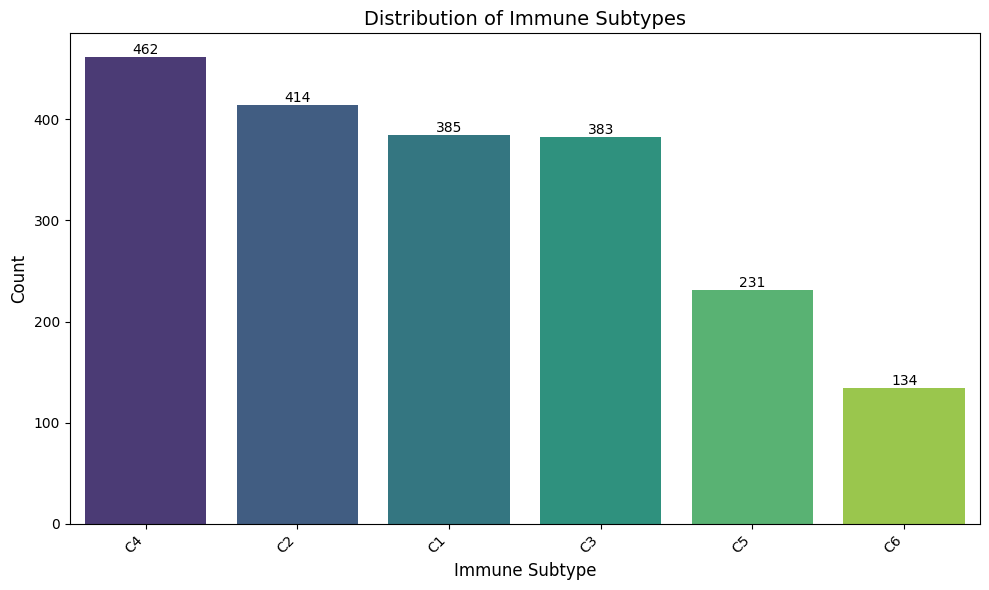

In [44]:

# Create the plot
plt.figure(figsize=(10, 6))

# Bar plot using Seaborn
ax = sns.countplot(data=df_final, x='Immune Subtype', 
                   order=df_final['Immune Subtype'].value_counts().index,
                   palette='viridis')

# Add counts on top of bars
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', 
                xytext=(0, 5), 
                textcoords='offset points')

# Customize the plot
plt.title('Distribution of Immune Subtypes', fontsize=14)
plt.xlabel('Immune Subtype', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45, ha='right')  # Rotate x-labels for better readability

# Adjust layout to prevent label cutoff
plt.tight_layout()
plt.show()

In [45]:
# next steps, remove missingness , nmf - feature reduction, normalization, standardization, outliers etc
# perform classification


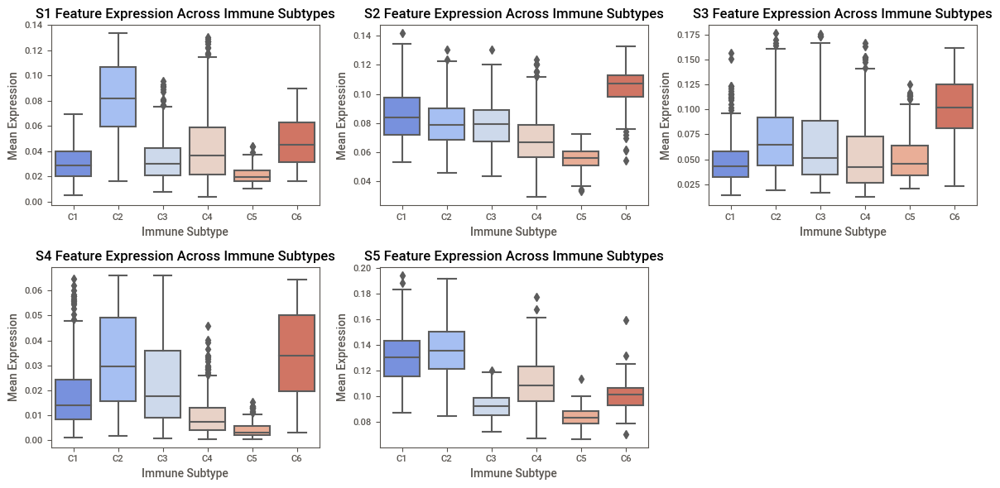

In [64]:


# Group features by suffix (S1, S2, S3, etc.)
feature_groups = {}
for suffix in ['S1', 'S2', 'S3', 'S4', 'S5']:
    feature_groups[suffix] = [col for col in df_final_normalized.columns if col.endswith(f"_{suffix}")]

# Compute mean expression for each feature group per immune subtype
group_means = pd.DataFrame()
for group, features in feature_groups.items():
    if features:
        group_means[group] = df_final_normalized[features].mean(axis=1)

# Add immune subtype labels
group_means['Immune Subtype'] = df_final_normalized['Immune Subtype']

# Plot each feature group across different immune subtypes
plt.figure(figsize=(12, 6))
for i, group in enumerate(feature_groups.keys(), 1):
    plt.subplot(2, 3, i)
    sns.boxplot(x='Immune Subtype', y=group, data=group_means, palette='coolwarm')
    plt.title(f"{group} Feature Expression Across Immune Subtypes")
    plt.xlabel("Immune Subtype")
    plt.ylabel("Mean Expression")

plt.tight_layout()
plt.show()


In [65]:
import numpy as np

# Convert categorical immune subtype labels to numerical
immune_subtype_numeric = LabelEncoder().fit_transform(df_final_normalized['Immune Subtype'])

# Compute correlation for each feature group
correlations = {}
for suffix in ['S1', 'S2', 'S3', 'S4', 'S5']:
    feature_subset = [col for col in df_final_normalized.columns if col.endswith(f"_{suffix}")]
    if feature_subset:
        mean_expression = df_final_normalized[feature_subset].mean(axis=1)
        correlations[suffix] = np.corrcoef(mean_expression, immune_subtype_numeric)[0, 1]

# Print correlation values
for group, corr in correlations.items():
    print(f"Correlation between {group} features and immune subtype: {corr:.4f}")


Correlation between S1 features and immune subtype: -0.1655
Correlation between S2 features and immune subtype: -0.1757
Correlation between S3 features and immune subtype: 0.1368
Correlation between S4 features and immune subtype: -0.1786
Correlation between S5 features and immune subtype: -0.5616


In [83]:
# Count the number of features for each suffix
feature_counts = {suffix: len(features) for suffix, features in feature_groups.items()}
print(feature_counts)


{'S1': 24, 'S2': 80, 'S3': 111, 'S4': 15, 'S5': 210}


## Scaling and Normalization

In [46]:


from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Select only numeric columns for preprocessing
numeric_cols = df_final.select_dtypes(include=['number']).columns

# Standardization (Z-score: mean=0, std=1)
scaler = StandardScaler()
df_final_standardized = df_final.copy()
df_final_standardized[numeric_cols] = scaler.fit_transform(df_final[numeric_cols])

# Normalization (Min-Max Scaling: range 0-1)
min_max_scaler = MinMaxScaler()
df_final_normalized = df_final.copy()
df_final_normalized[numeric_cols] = min_max_scaler.fit_transform(df_final[numeric_cols])


In [47]:
df_final_normalized.head()

,ACTL6A_S5,ADAM9_S2,ADAMTS1_S5,ADCY7_S3,AIMP2_S5,ALKBH7_S5,ALOX5AP_S3,AMPD3_S3,APITD1_S5,APOC1_S3,APOE_S3,APOO_S5,ARHGAP1_S2,ARHGAP15_S3,ARHGDIA_S2,ARRB2_S3,B2M_S3,BCCIP_S5,BRCA2_S5,BRIP1_S5,BSG_S2,BTK_S3,C11orf24_S5,C12orf24_S5,C13orf1_S5,C13orf18_S3,C13orf27_S5,C16orf61_S5,C19orf48_S5,C1orf54_S3,C3AR1_S3,C3orf26_S5,CASP1_S3,CBX1_S5,CCBL2_S5,CCL2_S3,CCL5_S3,CCRL2_S3,CCT5_S5,CD14_S4,CD163_S3,CD19_S4,CD247_S4,CD33_S3,CD37_S4,CD3D_S4,CD3E_S4,CD3G_S4,CD44_S2,CD48_S3,CD52_S3,CD53_S3,CD59_S2,CD79A_S4,CD79B_S4,CD84_S3,CD86_S3,CD8A_S3,CD8B_S4,CD97_S3,CDCA4_S5,CDH6_S2,CDK2_S5,CECR1_S3,CELF2_S3,CENPJ_S5,CENPN_S5,CENPO_S5,CENPW_S5,CEP78_S5,CHEK1_S5,CKLF_S5,COL16A1_S2,COL1A2_S2,COL3A1_S2,COL6A1_S2,COL6A3_S2,COL8A1_S2,COPS6_S5,COQ2_S5,CORO1A_S3,CORO1C_S5,COTL1_S5,COX17_S5,CPEB4_S5,CPVL_S3,CSF1R_S3,CTNNA1_S2,CTNNB1_S2,CTSC_S3,CTSL1_S3,CTSS_S3,CXCL10_S1,CXCR4_S3,CYBB_S3,CYTIP_S3,DAPK1_S3,DBNDD1_S5,DCBLD2_S5,DCK_S5,DCLRE1B_S5,DDX58_S1,DDX60_S1,DHFR_S5,DLEU1_S5,DLEU2_S5,DOCK2_S3,DSP_S2,DUT_S5,DVL1_S2,DVL3_S2,DYNLT1_S5,EBNA1BP2_S5,EFNA5_S2,EIF2AK1_S5,EIF4EBP1_S5,EIF4G1_S5,EMP2_S5,ENO1_S5,EPHA2_S2,EPHB2_S2,EPHB3_S2,EPHB4_S2,ERLIN1_S5,EVI2A_S3,EVI2B_S3,EXOSC8_S5,EZR_S5,F3_S5,FAM167A_S5,FAM89B_S5,FARSA_S5,FARSB_S5,FBXO41_S5,FCER1G_S3,FCGR1A_S3,FCGR2A_S3,FCGR2B_S3,FCGR3A_S3,FGD1_S2,FGL2_S3,FGR_S3,FLI1_S3,FLNC_S5,FMNL1_S3,FN1_S2,FNBP1_S3,FPR3_S3,FYB_S3,GGH_S5,GIMAP4_S3,GLRX3_S5,GNG11_S5,GNPTAB_S3,GPLD1_S5,GPNMB_S3,GSTCD_S5,H2AFZ_S5,HAS2_S5,HAUS1_S5,HCK_S3,HCLS1_S3,HDC_S4,HERC5_S1,HERC6_S1,HLA-DMA_S3,HLA-DRB1_S3,HMGN2_S5,HMHA1_S3,HN1L_S5,HNRNPA2B1_S5,HNRNPR_S5,HSPB11_S5,HSPG2_S2,HYLS1_S5,ICAM1_S2,ID2_S5,ID3_S5,IFI16_S3,IFI27_S1,IFI30_S3,IFI44_S1,IFI44L_S1,IFI6_S1,IFIH1_S1,IFIT1_S1,IFIT2_S1,IFIT3_S1,IFRD2_S5,IGF2R_S2,IGFBP2_S2,IGFBP3_S2,IGFBP4_S2,IGFBP5_S2,IGJ_S4,IKZF1_S3,IL10RA_S3,IL18_S3,IL7R_S3,IMP4_S5,IPO4_S5,ISG15_S1,ITGA3_S2,ITGA4_S2,ITGA5_S2,ITGA6_S5,ITGB2_S2,ITGB3_S2,ITGB5_S2,ITGB8_S2,JUNB_S5,JUP_S2,KIAA0090_S5,KRR1_S5,LAIR1_S3,LAMA4_S2,LAMB1_S2,LAPTM5_S3,LCK_S4,LCP1_S3,LCP2_S3,LHFPL2_S3,LILRB4_S3,LMNB2_S5,LOXL2_S5,LRMP_S3,LRP1_S2,LRRC17_S2,LRRC40_S5,LSM3_S5,LSM4_S5,LST1_S3,LTB_S4,LY86_S3,LYAR_S5,LYN_S3,LYZ_S3,MAGOHB_S5,MAP3K8_S5,MAPRE1_S5,MARCKSL1_S2,MARVELD2_S5,MCM3_S5,MCM7_S5,MCTS1_S5,MERTK_S3,MET_S5,MFSD11_S5,MKKS_S5,MLF1IP_S5,MMP11_S2,MMP1_S2,MMP14_S2,MMP17_S2,MMP19_S2,MMP2_S2,MMP3_S2,MNAT1_S5,MNDA_S3,MPP1_S3,MRPL12_S5,MRPL37_S5,MRPS16_S5,MRPS28_S5,MRTO4_S5,MS4A1_S4,MSN_S3,MT1F_S5,MT3_S5,MTA1_S2,MTHFD1_S5,MX1_S1,MYBL1_S5,MYBL2_S5,MYCBP_S5,MYL6_S5,MYO1F_S3,NCEH1_S5,NCF2_S3,NCKAP1L_S3,NCLN_S5,NEO1_S2,NID1_S2,NLN_S5,NME1_S5,NOP16_S5,NOTCH2_S2,NPC2_S3,NPL_S3,NRIP3_S5,NUDT1_S5,NUDT15_S5,NUP107_S5,NUP35_S5,NUP85_S5,NUP93_S5,NUPL1_S5,NUTF2_S5,OAS1_S1,OAS2_S1,OAS3_S1,OASL_S1,OSBPL3_S3,PA2G4_S5,PAICS_S5,PAK1_S2,PAK2_S2,PDAP1_S5,PDIA4_S5,PDLIM7_S5,PFKP_S5,PFN1_S5,PGM2_S5,PHF19_S5,PIK3CG_S3,PITPNC1_S5,PLAT_S2,PLAUR_S5,PLCG2_S3,PLEK_S3,PLG_S5,PLK4_S5,PLOD2_S5,PNN_S5,PNO1_S5,POLE2_S5,POLR3K_S5,PPIH_S5,PSMA7_S5,PSMC3_S5,PSMD12_S5,PSMD14_S5,PSMD2_S5,PTPLB_S5,PTPRC_S3,PXN_S2,RAB3B_S5,RAC1_S2,RASSF2_S3,RASSF4_S3,RBM14_S5,RFC3_S5,RGS8_S5,RHOA_S2,RHOB_S2,RHOC_S5,RHOG_S2,RHOQ_S2,RMND5B_S5,RNASE6_S3,RND3_S2,RNF138_S5,RNF41_S5,RPN1_S5,RPP40_S5,RSAD2_S1,RTP4_S1,RUNX3_S3,RUVBL1_S5,SAMD9_S1,SAMHD1_S3,SAMSN1_S3,SAR1A_S5,SAR1B_S5,SDC1_S5,SELL_S3,SELPLG_S3,SEMA3F_S2,SERPINE1_S2,SH2B3_S3,SH3BP5L_S5,SKA1_S5,SKA2_S5,SLC16A1_S5,SLC1A3_S3,SLC25A40_S5,SLC25A5_S5,SLC7A7_S3,SMC2_S5,SMO_S2,SMS_S5,SMURF2_S5,SNRPA1_S5,SNRPA_S5,SNRPB_S5,SNRPC_S5,SNRPD1_S5,SNRPE_S5,SNX17_S5,SP140_S3,SPAG17_S5,SPARC_S2,SRM_S5,STAT1_S1,STK17A_S5,STRA13_S5,SYK_S3,TAGLN_S5,TAP1_S1,TBXAS1_S3,TCEB1_S5,TCF7L2_S2,THBS1_S2,THBS2_S2,TIMP1_S2,TLR2_S3,TMEM130_S5,TNC_S2,TNFAIP3_S3,TNFRSF12A_S5,TNFRSF1A_S2,TNFRSF1B_S3,TNFSF13B_S3,TOMM40_S5,TPI1_S5,TPM1_S5,TPM2_S5,TPM3_S5,TPRKB_S5,TRA2B_S5,TUBA4A_S5,TUBG1_S5,UAP1_S5,UBE2J1_S5,UMPS_S5,UQCR10_S5,USPL1_S5,VCAN_S2,VDAC1_S5,VSIG4_S3,VTA1_S5,WDHD1_S5,WDR54_S5,WDR77_S5,WIPF1_S3,WNT2B_S2,WNT8B_S2,WSB2_S5,ZWILCH_S5,ZYX_S2,Immune Subtype
TCGA Participant Barcode,,,,,,,

In [48]:
df_final_normalized.to_csv("df_final_normalized.csv")

## Outliers Handling

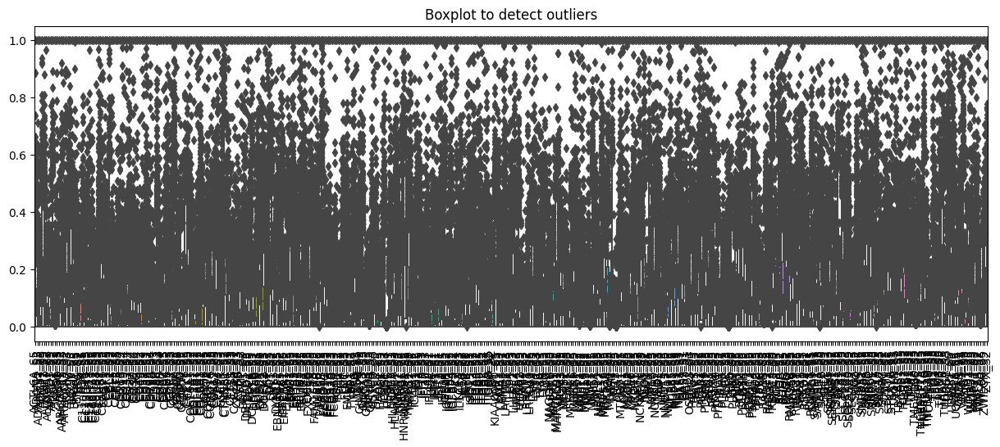

In [49]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import NMF
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Visualize Outliers
def visualize_outliers(df):
    plt.figure(figsize=(15, 5))
    sns.boxplot(data=df)
    plt.xticks(rotation=90)
    plt.title("Boxplot to detect outliers")
    plt.show()

# Outlier Treatment using IQR Method
# Outlier Treatment using IQR Method (Handle Non-Numeric Columns)
def remove_outliers_iqr(df):
    numeric_df = df.select_dtypes(include=[np.number])  # Keep only numeric columns
    Q1 = numeric_df.quantile(0.25)
    Q3 = numeric_df.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    numeric_df = numeric_df.clip(lower=lower_bound, upper=upper_bound, axis=1)

    # Merge back non-numeric columns
    df[numeric_df.columns] = numeric_df
    return df


# Load Data (Assuming df_final_normalized is pre-loaded)
# df_final_normalized = pd.read_csv("your_data.csv")  # Uncomment if loading from file

# Visualize and Remove Outliers
visualize_outliers(df_final_normalized)
df_final_normalized = remove_outliers_iqr(df_final_normalized)



## Feature Reduction- Performing NMF 

/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklea

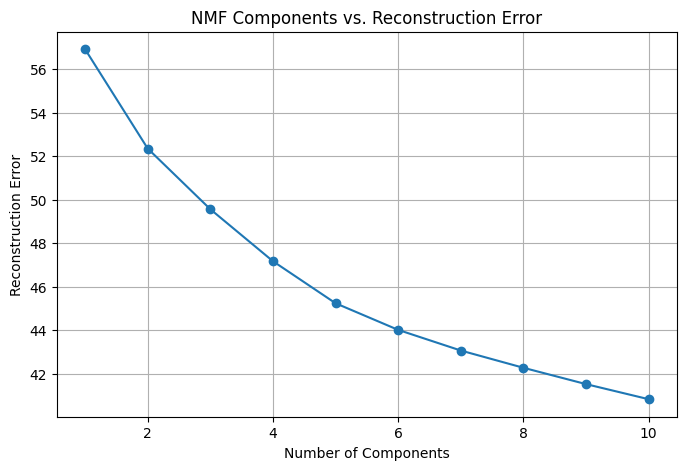

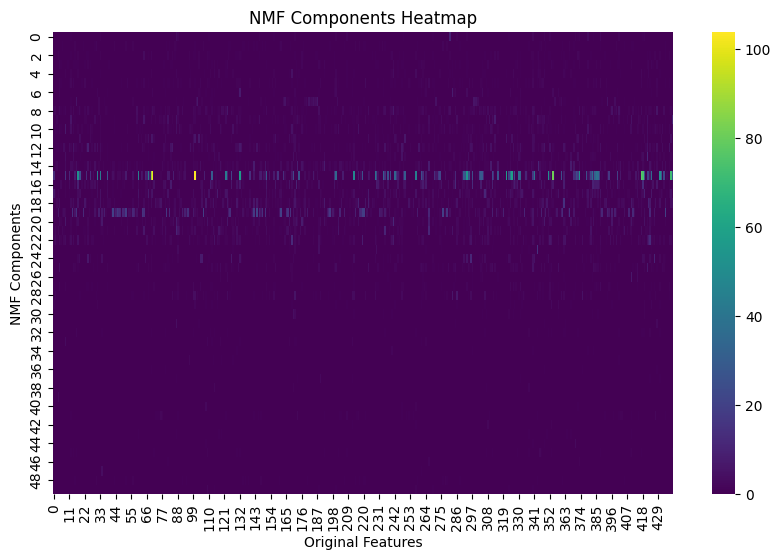

In [50]:
# Section 3: Perform NMF (excluding output variable)
X = df_final_normalized.drop(columns=['Immune Subtype'])  # Exclude target variable
nmf = NMF(n_components=50, random_state=42)  # Choose appropriate components
X_nmf = nmf.fit_transform(X)

# Explained Reconstruction Error Plot
reconstruction_errors = []
components_range = range(1, 11)
for n in components_range:
    nmf_test = NMF(n_components=n, random_state=42)
    nmf_test.fit(X)
    reconstruction_errors.append(nmf_test.reconstruction_err_)

plt.figure(figsize=(8, 5))
plt.plot(components_range, reconstruction_errors, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Reconstruction Error')
plt.title('NMF Components vs. Reconstruction Error')
plt.grid()
plt.show()

# Visualizing NMF Components
plt.figure(figsize=(10, 6))
sns.heatmap(nmf.components_, cmap='viridis', annot=False)
plt.xlabel("Original Features")
plt.ylabel("NMF Components")
plt.title("NMF Components Heatmap")
plt.show()


##### 

-knn,svc, xgb,nn different hyperparamters, cross val score, f1, recall
-pros/cons for everything
- upto 6 minutes
-pdf file will have comments as well its just a py version of it

## Feature Correlation Plots

Top correlations with Immune Subtype:
Immune Subtype    1.000000
RASSF4_S3         0.471393
RASSF2_S3         0.467887
CPEB4_S5          0.456713
SLC1A3_S3         0.427795
CELF2_S3          0.415925
EVI2A_S3          0.410678
APOE_S3           0.408811
CSF1R_S3          0.407040
FAM167A_S5        0.404026
Name: Immune Subtype, dtype: float64

Bottom correlations with Immune Subtype:
NUDT15_S5   -0.514211
MYBL2_S5    -0.513117
ACTL6A_S5   -0.505404
CENPW_S5    -0.496627
CDCA4_S5    -0.491714
SNRPB_S5    -0.487020
MCM3_S5     -0.479625
ZWILCH_S5   -0.479406
PLK4_S5     -0.476722
JUP_S2      -0.476225
Name: Immune Subtype, dtype: float64


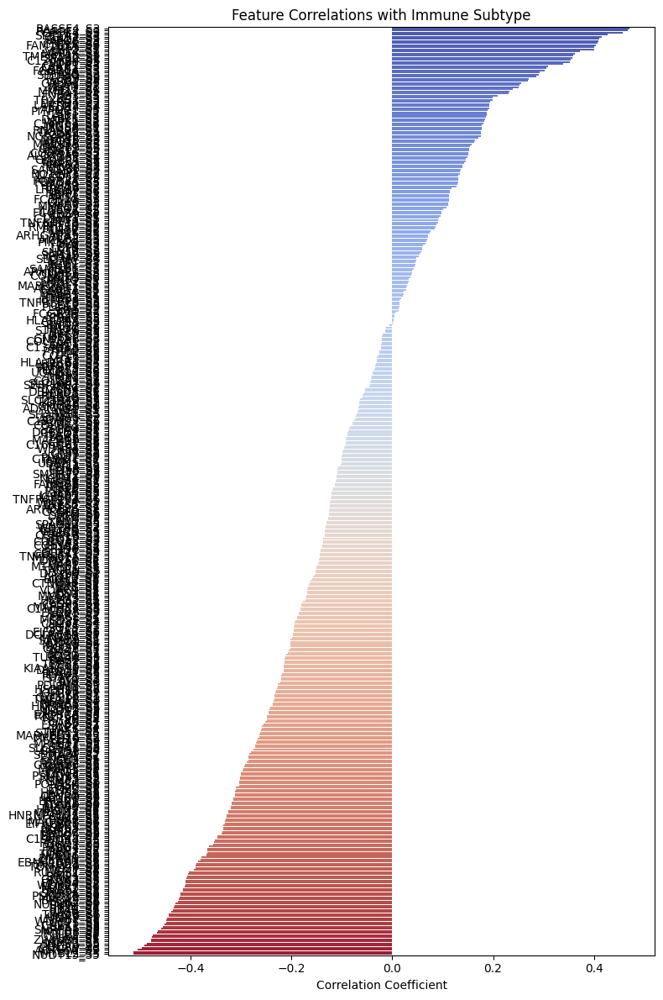

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


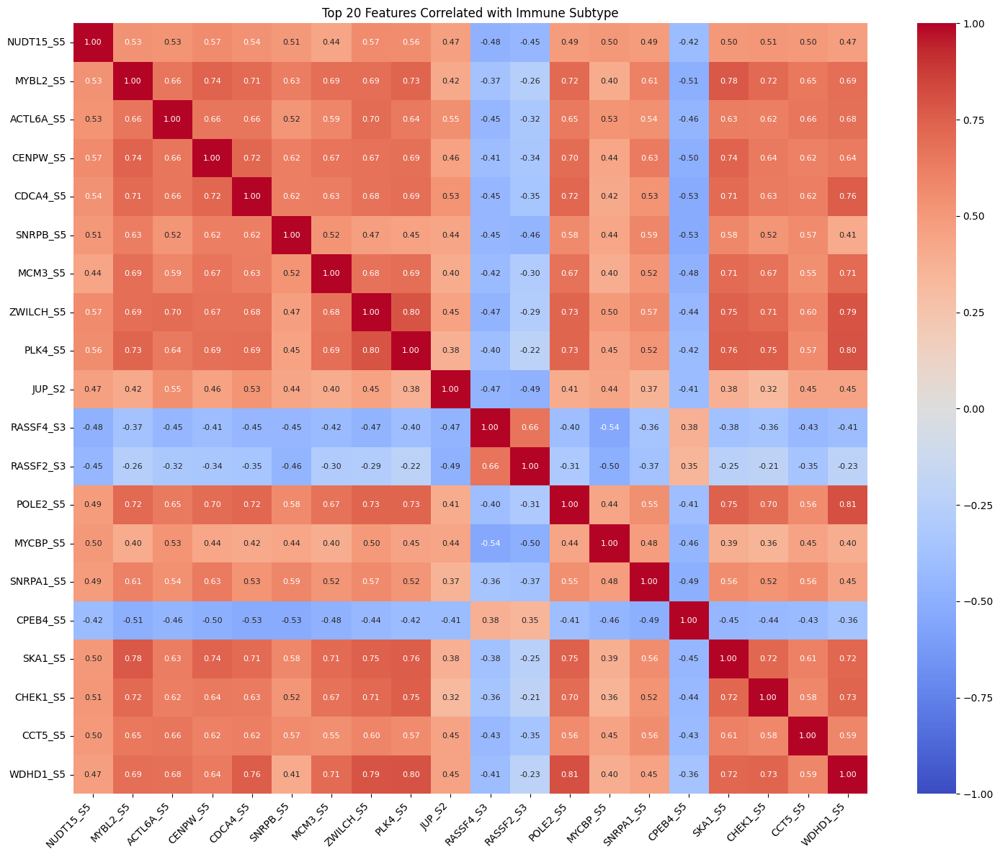

In [51]:


# Encode target variable
le = LabelEncoder()
y = le.fit_transform(df_final_normalized['Immune Subtype'])  # Encode categorical labels

# Convert y to DataFrame
y_df = pd.DataFrame(y, columns=['Immune Subtype'])

# Drop target from X
X = df_final_normalized.drop(columns=['Immune Subtype'])

# Reset indices and concatenate
X = X.reset_index(drop=True)
y_df = y_df.reset_index(drop=True)
df = pd.concat([X, y_df], axis=1)

# Compute correlation matrix
corr_matrix = df.corr()

# 1. First look specifically at Immune Subtype correlations
print("Top correlations with Immune Subtype:")
print(corr_matrix["Immune Subtype"].sort_values(ascending=False).head(10))
print("\nBottom correlations with Immune Subtype:")
print(corr_matrix["Immune Subtype"].sort_values().head(10))

# 2. Better visualization focused on Immune Subtype
plt.figure(figsize=(8, 12))
immune_corrs = corr_matrix["Immune Subtype"].sort_values(ascending=False)
immune_corrs = immune_corrs[immune_corrs.index != "Immune Subtype"]  # Remove self-correlation
sns.barplot(x=immune_corrs.values, y=immune_corrs.index, palette="coolwarm")
plt.title("Feature Correlations with Immune Subtype")
plt.xlabel("Correlation Coefficient")
plt.tight_layout()
plt.show()

# 3. Filtered heatmap version (adjusted threshold)
plt.figure(figsize=(15, 12))
threshold = 0.3  # More reasonable biological threshold

# Get top N features correlated with Immune Subtype
top_features = corr_matrix["Immune Subtype"].abs().sort_values(ascending=False).index[1:21]  # Top 20 excluding self
filtered_corr = corr_matrix.loc[top_features, top_features]

sns.heatmap(filtered_corr, annot=True, cmap='coolwarm', 
            fmt='.2f', vmin=-1, vmax=1, center=0,
            annot_kws={"size": 8})
plt.title("Top 20 Features Correlated with Immune Subtype")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [52]:

X_selected = df_final_normalized[top_features]
X_selected.head()

,NUDT15_S5,MYBL2_S5,ACTL6A_S5,CENPW_S5,CDCA4_S5,SNRPB_S5,MCM3_S5,ZWILCH_S5,PLK4_S5,JUP_S2,RASSF4_S3,RASSF2_S3,POLE2_S5,MYCBP_S5,SNRPA1_S5,CPEB4_S5,SKA1_S5,CHEK1_S5,CCT5_S5,WDHD1_S5
TCGA Participant Barcode,,,,,,,,,,,,,,,,,,,,
TCGA-WA-A7H4,0.158879,0.036125,0.129424,0.036657,0.239033,0.110974,0.216977,0.154684,0.272897,0.081848,0.025563,0.006755,0.136847,0.094650,0.098420,0.066910,0.023298,0.341859,0.139557,0.079282
TCGA-B5-A3F9,0.124530,0.032607,0.123828,0.029258,0.158576,0.147041,0.152350,0.144194,0.139299,0.020165,0.028804,0.012288,0.096535,0.157460,0.150227,0.037612,0.027082,0.168456,0.123400,0.034451
TCGA-49-6767,0.164204,0.031808,0.150459,0.022736,0.182581,0.153509,0.115889,0.099884,0.198844,0.048325,0.053798,0.002001,0.152285,0.093955,0.155771,0.019654,0.032137,0.319432,0.213498,0.094871
TCGA-AA-A03J,0.106287,0.108375,0.083904,0.049675,0.109814,0.135313,0.175003,0.079119,0.082470,0.076755,0.026893,0.001996,0.073111,0.080209,0.132591,0.024473,0.039170,0.107756,0.159937,0.018202
TCGA-77-7337,0.159017,0.103269,0.251188,0.049675,0.242704,0.076978,0.076036,0.160216,0.208554,0.102031,0.006769,0.004547,0.182561,0.062224,0.228911,0.073843,0.065265,0.422631,0.222876,0.114240


In [53]:
df.head()

,ACTL6A_S5,ADAM9_S2,ADAMTS1_S5,ADCY7_S3,AIMP2_S5,ALKBH7_S5,ALOX5AP_S3,AMPD3_S3,APITD1_S5,APOC1_S3,APOE_S3,APOO_S5,ARHGAP1_S2,ARHGAP15_S3,ARHGDIA_S2,ARRB2_S3,B2M_S3,BCCIP_S5,BRCA2_S5,BRIP1_S5,BSG_S2,BTK_S3,C11orf24_S5,C12orf24_S5,C13orf1_S5,C13orf18_S3,C13orf27_S5,C16orf61_S5,C19orf48_S5,C1orf54_S3,C3AR1_S3,C3orf26_S5,CASP1_S3,CBX1_S5,CCBL2_S5,CCL2_S3,CCL5_S3,CCRL2_S3,CCT5_S5,CD14_S4,CD163_S3,CD19_S4,CD247_S4,CD33_S3,CD37_S4,CD3D_S4,CD3E_S4,CD3G_S4,CD44_S2,CD48_S3,CD52_S3,CD53_S3,CD59_S2,CD79A_S4,CD79B_S4,CD84_S3,CD86_S3,CD8A_S3,CD8B_S4,CD97_S3,CDCA4_S5,CDH6_S2,CDK2_S5,CECR1_S3,CELF2_S3,CENPJ_S5,CENPN_S5,CENPO_S5,CENPW_S5,CEP78_S5,CHEK1_S5,CKLF_S5,COL16A1_S2,COL1A2_S2,COL3A1_S2,COL6A1_S2,COL6A3_S2,COL8A1_S2,COPS6_S5,COQ2_S5,CORO1A_S3,CORO1C_S5,COTL1_S5,COX17_S5,CPEB4_S5,CPVL_S3,CSF1R_S3,CTNNA1_S2,CTNNB1_S2,CTSC_S3,CTSL1_S3,CTSS_S3,CXCL10_S1,CXCR4_S3,CYBB_S3,CYTIP_S3,DAPK1_S3,DBNDD1_S5,DCBLD2_S5,DCK_S5,DCLRE1B_S5,DDX58_S1,DDX60_S1,DHFR_S5,DLEU1_S5,DLEU2_S5,DOCK2_S3,DSP_S2,DUT_S5,DVL1_S2,DVL3_S2,DYNLT1_S5,EBNA1BP2_S5,EFNA5_S2,EIF2AK1_S5,EIF4EBP1_S5,EIF4G1_S5,EMP2_S5,ENO1_S5,EPHA2_S2,EPHB2_S2,EPHB3_S2,EPHB4_S2,ERLIN1_S5,EVI2A_S3,EVI2B_S3,EXOSC8_S5,EZR_S5,F3_S5,FAM167A_S5,FAM89B_S5,FARSA_S5,FARSB_S5,FBXO41_S5,FCER1G_S3,FCGR1A_S3,FCGR2A_S3,FCGR2B_S3,FCGR3A_S3,FGD1_S2,FGL2_S3,FGR_S3,FLI1_S3,FLNC_S5,FMNL1_S3,FN1_S2,FNBP1_S3,FPR3_S3,FYB_S3,GGH_S5,GIMAP4_S3,GLRX3_S5,GNG11_S5,GNPTAB_S3,GPLD1_S5,GPNMB_S3,GSTCD_S5,H2AFZ_S5,HAS2_S5,HAUS1_S5,HCK_S3,HCLS1_S3,HDC_S4,HERC5_S1,HERC6_S1,HLA-DMA_S3,HLA-DRB1_S3,HMGN2_S5,HMHA1_S3,HN1L_S5,HNRNPA2B1_S5,HNRNPR_S5,HSPB11_S5,HSPG2_S2,HYLS1_S5,ICAM1_S2,ID2_S5,ID3_S5,IFI16_S3,IFI27_S1,IFI30_S3,IFI44_S1,IFI44L_S1,IFI6_S1,IFIH1_S1,IFIT1_S1,IFIT2_S1,IFIT3_S1,IFRD2_S5,IGF2R_S2,IGFBP2_S2,IGFBP3_S2,IGFBP4_S2,IGFBP5_S2,IGJ_S4,IKZF1_S3,IL10RA_S3,IL18_S3,IL7R_S3,IMP4_S5,IPO4_S5,ISG15_S1,ITGA3_S2,ITGA4_S2,ITGA5_S2,ITGA6_S5,ITGB2_S2,ITGB3_S2,ITGB5_S2,ITGB8_S2,JUNB_S5,JUP_S2,KIAA0090_S5,KRR1_S5,LAIR1_S3,LAMA4_S2,LAMB1_S2,LAPTM5_S3,LCK_S4,LCP1_S3,LCP2_S3,LHFPL2_S3,LILRB4_S3,LMNB2_S5,LOXL2_S5,LRMP_S3,LRP1_S2,LRRC17_S2,LRRC40_S5,LSM3_S5,LSM4_S5,LST1_S3,LTB_S4,LY86_S3,LYAR_S5,LYN_S3,LYZ_S3,MAGOHB_S5,MAP3K8_S5,MAPRE1_S5,MARCKSL1_S2,MARVELD2_S5,MCM3_S5,MCM7_S5,MCTS1_S5,MERTK_S3,MET_S5,MFSD11_S5,MKKS_S5,MLF1IP_S5,MMP11_S2,MMP1_S2,MMP14_S2,MMP17_S2,MMP19_S2,MMP2_S2,MMP3_S2,MNAT1_S5,MNDA_S3,MPP1_S3,MRPL12_S5,MRPL37_S5,MRPS16_S5,MRPS28_S5,MRTO4_S5,MS4A1_S4,MSN_S3,MT1F_S5,MT3_S5,MTA1_S2,MTHFD1_S5,MX1_S1,MYBL1_S5,MYBL2_S5,MYCBP_S5,MYL6_S5,MYO1F_S3,NCEH1_S5,NCF2_S3,NCKAP1L_S3,NCLN_S5,NEO1_S2,NID1_S2,NLN_S5,NME1_S5,NOP16_S5,NOTCH2_S2,NPC2_S3,NPL_S3,NRIP3_S5,NUDT1_S5,NUDT15_S5,NUP107_S5,NUP35_S5,NUP85_S5,NUP93_S5,NUPL1_S5,NUTF2_S5,OAS1_S1,OAS2_S1,OAS3_S1,OASL_S1,OSBPL3_S3,PA2G4_S5,PAICS_S5,PAK1_S2,PAK2_S2,PDAP1_S5,PDIA4_S5,PDLIM7_S5,PFKP_S5,PFN1_S5,PGM2_S5,PHF19_S5,PIK3CG_S3,PITPNC1_S5,PLAT_S2,PLAUR_S5,PLCG2_S3,PLEK_S3,PLG_S5,PLK4_S5,PLOD2_S5,PNN_S5,PNO1_S5,POLE2_S5,POLR3K_S5,PPIH_S5,PSMA7_S5,PSMC3_S5,PSMD12_S5,PSMD14_S5,PSMD2_S5,PTPLB_S5,PTPRC_S3,PXN_S2,RAB3B_S5,RAC1_S2,RASSF2_S3,RASSF4_S3,RBM14_S5,RFC3_S5,RGS8_S5,RHOA_S2,RHOB_S2,RHOC_S5,RHOG_S2,RHOQ_S2,RMND5B_S5,RNASE6_S3,RND3_S2,RNF138_S5,RNF41_S5,RPN1_S5,RPP40_S5,RSAD2_S1,RTP4_S1,RUNX3_S3,RUVBL1_S5,SAMD9_S1,SAMHD1_S3,SAMSN1_S3,SAR1A_S5,SAR1B_S5,SDC1_S5,SELL_S3,SELPLG_S3,SEMA3F_S2,SERPINE1_S2,SH2B3_S3,SH3BP5L_S5,SKA1_S5,SKA2_S5,SLC16A1_S5,SLC1A3_S3,SLC25A40_S5,SLC25A5_S5,SLC7A7_S3,SMC2_S5,SMO_S2,SMS_S5,SMURF2_S5,SNRPA1_S5,SNRPA_S5,SNRPB_S5,SNRPC_S5,SNRPD1_S5,SNRPE_S5,SNX17_S5,SP140_S3,SPAG17_S5,SPARC_S2,SRM_S5,STAT1_S1,STK17A_S5,STRA13_S5,SYK_S3,TAGLN_S5,TAP1_S1,TBXAS1_S3,TCEB1_S5,TCF7L2_S2,THBS1_S2,THBS2_S2,TIMP1_S2,TLR2_S3,TMEM130_S5,TNC_S2,TNFAIP3_S3,TNFRSF12A_S5,TNFRSF1A_S2,TNFRSF1B_S3,TNFSF13B_S3,TOMM40_S5,TPI1_S5,TPM1_S5,TPM2_S5,TPM3_S5,TPRKB_S5,TRA2B_S5,TUBA4A_S5,TUBG1_S5,UAP1_S5,UBE2J1_S5,UMPS_S5,UQCR10_S5,USPL1_S5,VCAN_S2,VDAC1_S5,VSIG4_S3,VTA1_S5,WDHD1_S5,WDR54_S5,WDR77_S5,WIPF1_S3,WNT2B_S2,WNT8B_S2,WSB2_S5,ZWILCH_S5,ZYX_S2,Immune Subtype
0,0.129424,0.169197,0.022398,0.

In [54]:
corr_matrix["Immune Subtype"].head()

ACTL6A_S5    -0.505404
ADAM9_S2     -0.072987
ADAMTS1_S5   -0.066917
ADCY7_S3      0.031620
AIMP2_S5     -0.157777
Name: Immune Subtype, dtype: float64

## Comparision of different feature reduction methods
### PCA VS NMF VS T-SNE

/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(


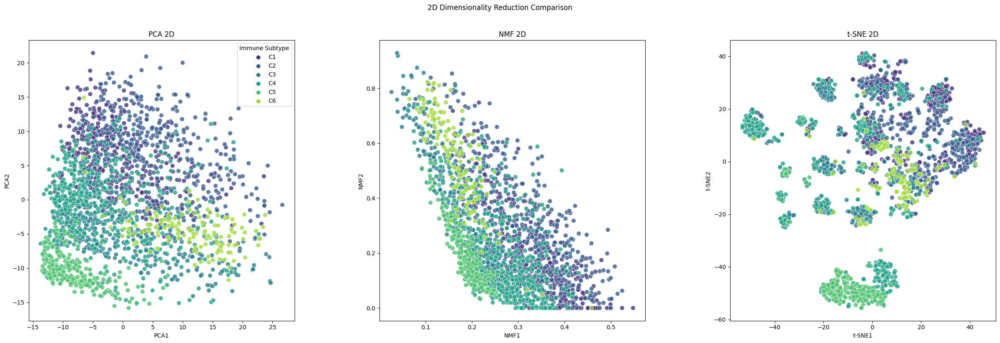

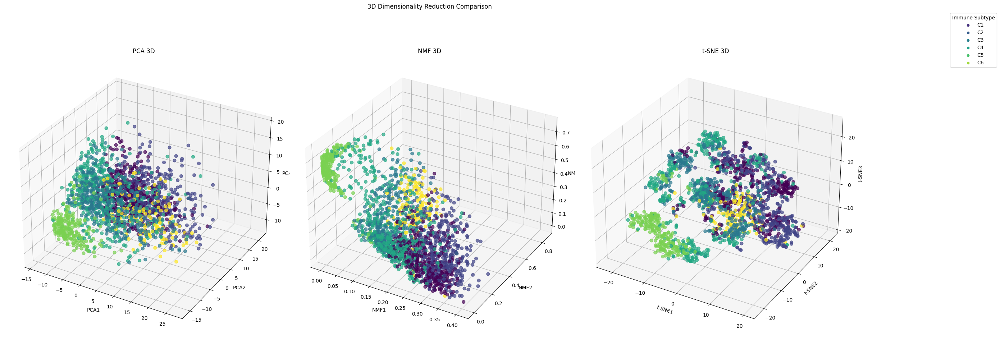

In [55]:

# Data preparation
X_full = df_final_normalized.drop(columns=['Immune Subtype'])
y = df_final_normalized['Immune Subtype']

# Scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_full)
minmax_scaler = MinMaxScaler()
X_nonneg = minmax_scaler.fit_transform(X_full)

# Dimensionality reductions (create all versions but don't visualize 100D)
## PCA
pca = PCA(n_components=0.90)
X_pca = pca.fit_transform(X_scaled)  # For later use
X_pca_2d = PCA(n_components=2).fit_transform(X_scaled)
X_pca_3d = PCA(n_components=3).fit_transform(X_scaled)
X_pca_100d = PCA(n_components=100).fit_transform(X_scaled)  # Created but not visualized

## NMF 
nmf = NMF(n_components=pca.n_components_, init='nndsvda', random_state=42)
X_nmf = nmf.fit_transform(X_nonneg)  # For later use
X_nmf_2d = NMF(n_components=2, init='nndsvda', random_state=42).fit_transform(X_nonneg)
X_nmf_3d = NMF(n_components=3, init='nndsvda', random_state=42).fit_transform(X_nonneg)
X_nmf_100d = NMF(n_components=100, init='nndsvda', random_state=42).fit_transform(X_nonneg)  # Created but not visualized

## t-SNE
X_tsne_2d = TSNE(n_components=2, perplexity=30, random_state=42).fit_transform(X_scaled)
X_tsne_3d = TSNE(n_components=3, perplexity=30, random_state=42, method='exact').fit_transform(X_scaled)
# Skip 100D t-SNE as it's not recommended

# Visualization function for 2D plots
def plot_2d(X, y, title, ax):
    sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=y,
                   palette='viridis', alpha=0.8, s=60, ax=ax)
    ax.set_title(title)
    ax.set_xlabel(f'{title.split()[0]}1')
    ax.set_ylabel(f'{title.split()[0]}2')

# Visualization function for 3D plots
def plot_3d(X, y, title, ax):
    scatter = ax.scatter(X[:, 0], X[:, 1], X[:, 2],
                        c=y.astype('category').cat.codes, 
                        cmap='viridis', alpha=0.7, s=40)
    ax.set_title(title)
    ax.set_xlabel(f'{title.split()[0]}1')
    ax.set_ylabel(f'{title.split()[0]}2')
    ax.set_zlabel(f'{title.split()[0]}3')
    return scatter

# Create 2D comparison plot
fig_2d, axes_2d = plt.subplots(1, 3, figsize=(24, 8))
plot_2d(X_pca_2d, y, 'PCA 2D', axes_2d[0])
plot_2d(X_nmf_2d, y, 'NMF 2D', axes_2d[1])
plot_2d(X_tsne_2d, y, 't-SNE 2D', axes_2d[2])
axes_2d[0].legend(title='Immune Subtype', bbox_to_anchor=(1, 1))
axes_2d[1].legend().remove()
axes_2d[2].legend().remove()
plt.suptitle('2D Dimensionality Reduction Comparison', y=1.02)
plt.tight_layout()
plt.show()

# Create 3D comparison plot
fig_3d = plt.figure(figsize=(24, 10))
ax1 = fig_3d.add_subplot(1, 3, 1, projection='3d')
plot_3d(X_pca_3d, y, 'PCA 3D', ax1)

ax2 = fig_3d.add_subplot(1, 3, 2, projection='3d')
plot_3d(X_nmf_3d, y, 'NMF 3D', ax2)

ax3 = fig_3d.add_subplot(1, 3, 3, projection='3d')
plot_3d(X_tsne_3d, y, 't-SNE 3D', ax3)

# Add single legend
legend_labels = y.unique()
for i, label in enumerate(legend_labels):
    ax1.scatter([], [], [], label=label, color=sns.color_palette('viridis')[i])
fig_3d.legend(title='Immune Subtype', bbox_to_anchor=(1.1, 1), loc='upper left')

plt.suptitle('3D Dimensionality Reduction Comparison', y=1.02)
plt.tight_layout()
plt.show()

# All transformed datasets are available for later use:
# X_pca, X_pca_100d, X_nmf, X_nmf_100d (but not visualized)

Best Feature Reduction:

t-SNE → Best separation, distinct clusters. 

PCA → Retains global structure but overlaps.

NMF → More structured than PCA but less separation than t-SNE.

For interpretability → PCA/NMF
For classification → t-SNE

## EDA

                                             |          | [  0%]   00:00 -> (? left)

/usr/local/lib/python3.10/dist-packages/sweetviz/graph_associations.py:219: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  new_dataframe[feature] = pd.Series(dtype=float)
/usr/local/lib/python3.10/dist-packages/sweetviz/graph_associations.py:219: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  new_dataframe[feature] = pd.Series(dtype=float)
/usr/local/lib/python3.10/dist-packages/sweetviz/graph_associations.py:219: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, 

Report report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



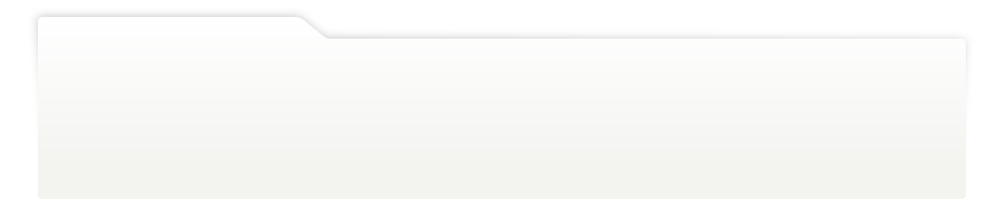
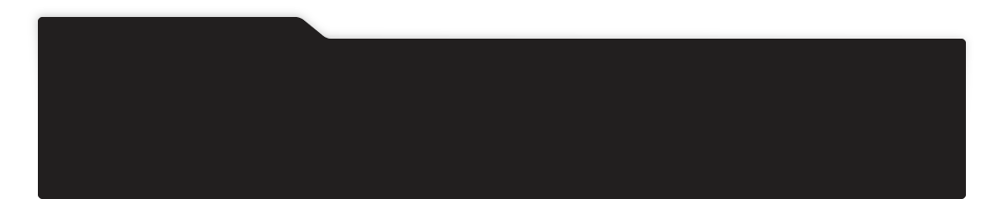
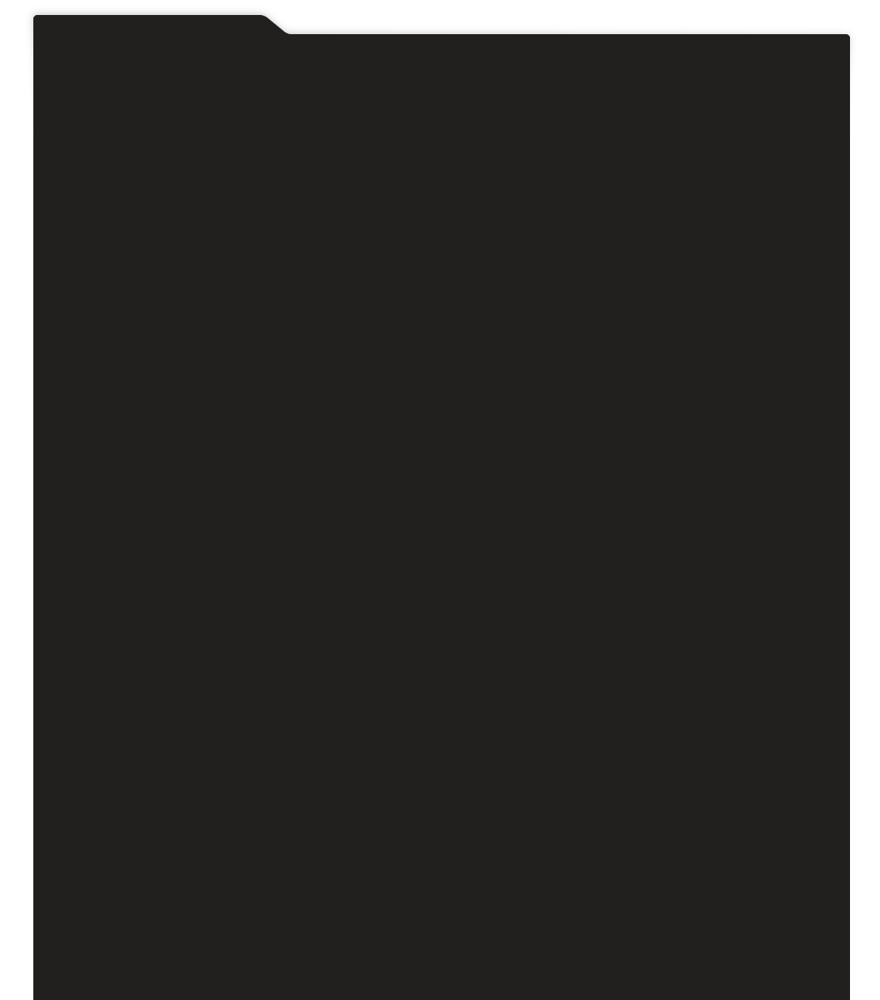
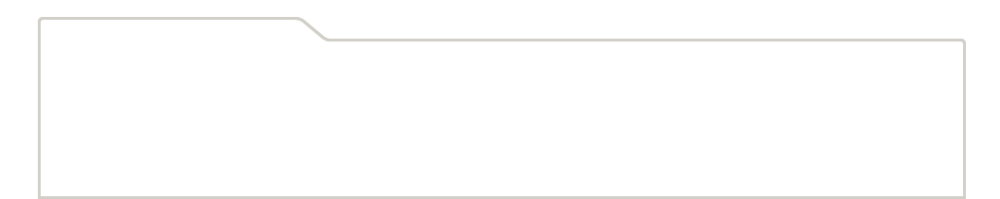
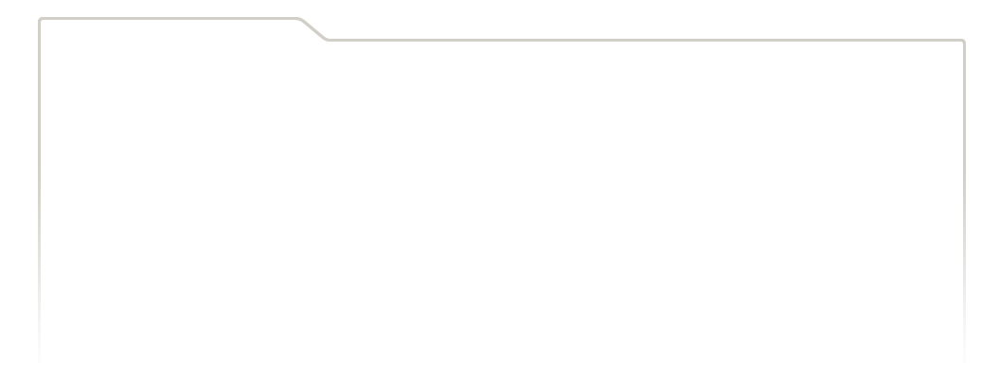
...
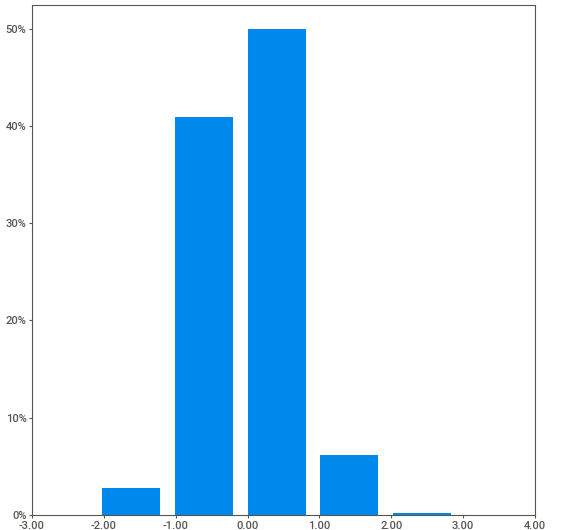
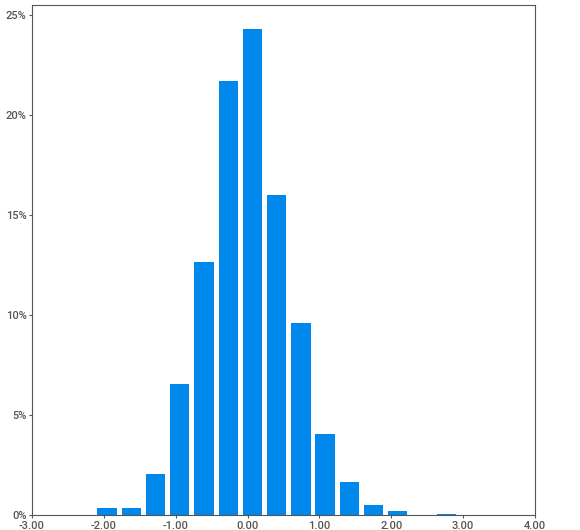
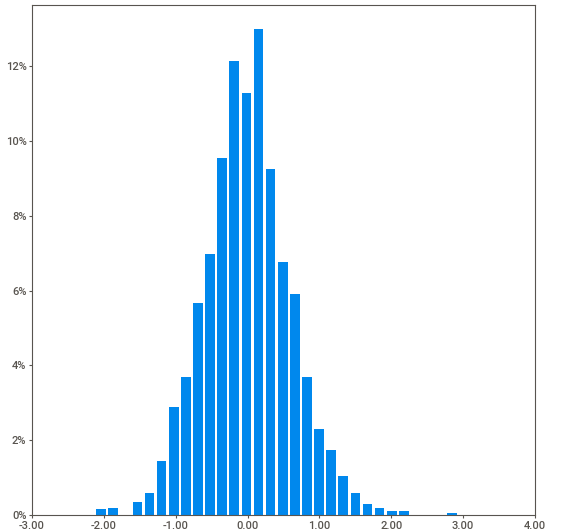
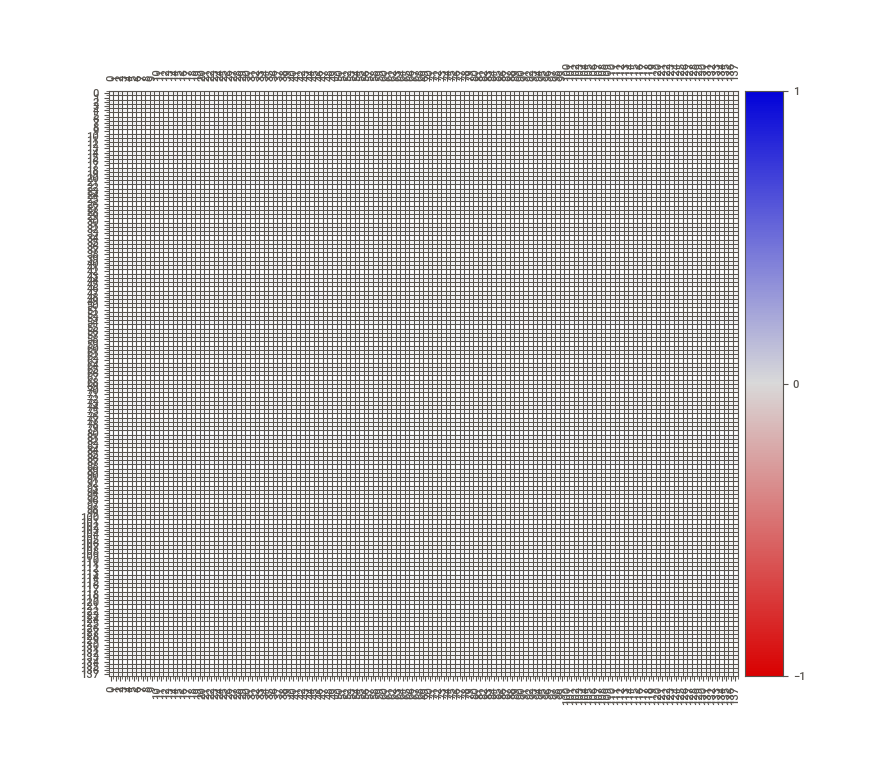
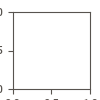

In [56]:
pca_df = pd.DataFrame(X_pca_3d)

y = le.fit_transform(df_final_normalized['Immune Subtype'])  # Encode categorical labels

# Convert y to DataFrame
y_df = pd.DataFrame(y, columns=['Immune Subtype'])

# Drop target from X

# Reset indices and concatenate
#X = X.reset_index(drop=True)
#y_df = y_df.reset_index(drop=True)
df = pd.concat([pca_df, y_df], axis=1)
import sweetviz as sv

# Generate a report
report = sv.analyze(pd.DataFrame(X_pca))

# Display inline in Kaggle
report.show_html("report.html")  # Save if needed
report.show_notebook()  # Inline display


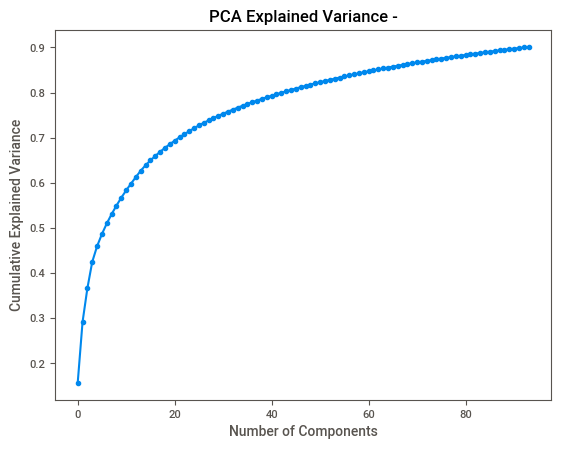

In [58]:
# X_full: Full dataset without dimensionality reduction
X_full = df_final_normalized.drop(columns=['Immune Subtype'])  # Assuming 'Immune Subtype' is the target variable
# X_pca: PCA-reduced dataset
from sklearn.decomposition import PCA

pca = PCA(n_components=0.90)
X_pca = pca.fit_transform(X_full)

explained_var_ratio = np.cumsum(pca.explained_variance_ratio_)
plt.plot(explained_var_ratio, marker='o')
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.title(f"PCA Explained Variance -")
plt.show()

# Section 2 - Classification Model Development 


===== Training Models on NMF Dataset =====
Training set: (1607, 138), Test set: (402, 138)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


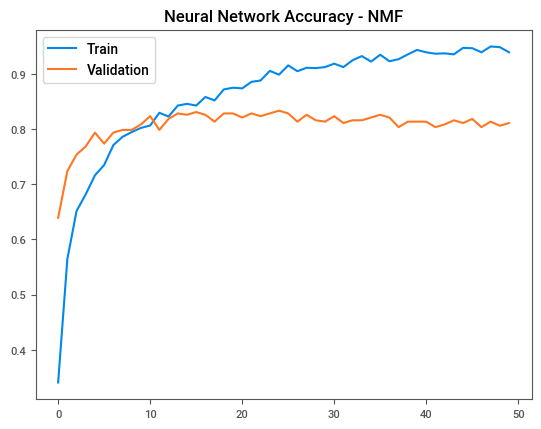

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step

Neural Network - NMF Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.87      0.81        77
           1       0.89      0.92      0.90        83
           2       0.81      0.75      0.78        77
           3       0.81      0.75      0.78        92
           4       0.83      0.93      0.88        46
           5       0.65      0.48      0.55        27

    accuracy                           0.81       402
   macro avg       0.79      0.78      0.78       402
weighted avg       0.81      0.81      0.81       402


Random Forest Accuracy: 0.7886
              precision    recall  f1-score   support

          C1       0.76      0.81      0.78        77
          C2       0.84      0.90      0.87        83
          C3       0.78      0.79      0.79        77
          C4       0.77      0.78      0.77        92
          C5       0.85      0.89      0.87        46
          C6   

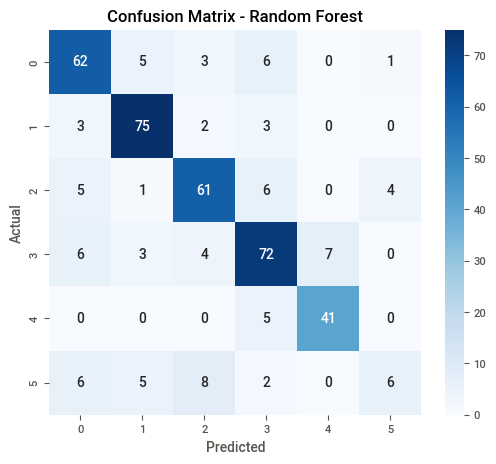

Best XGBoost Parameters for NMF: {'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 200}

XGBoost Accuracy: 0.8085
              precision    recall  f1-score   support

          C1       0.80      0.82      0.81        77
          C2       0.86      0.90      0.88        83
          C3       0.82      0.78      0.80        77
          C4       0.79      0.77      0.78        92
          C5       0.86      0.93      0.90        46
          C6       0.57      0.48      0.52        27

    accuracy                           0.81       402
   macro avg       0.78      0.78      0.78       402
weighted avg       0.81      0.81      0.81       402



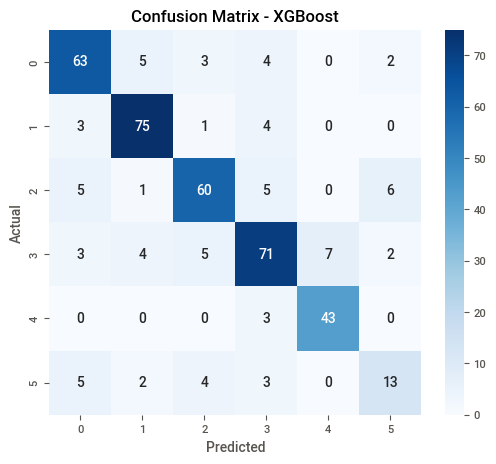

Fitting 3 folds for each of 150 candidates, totalling 450 fits
Best SVM Parameters for NMF: {'C': 10, 'class_weight': 'balanced', 'gamma': 'scale', 'kernel': 'rbf'}

SVM Accuracy: 0.7836
              precision    recall  f1-score   support

          C1       0.75      0.83      0.79        77
          C2       0.89      0.86      0.87        83
          C3       0.78      0.75      0.77        77
          C4       0.74      0.72      0.73        92
          C5       0.83      0.93      0.88        46
          C6       0.59      0.48      0.53        27

    accuracy                           0.78       402
   macro avg       0.76      0.76      0.76       402
weighted avg       0.78      0.78      0.78       402



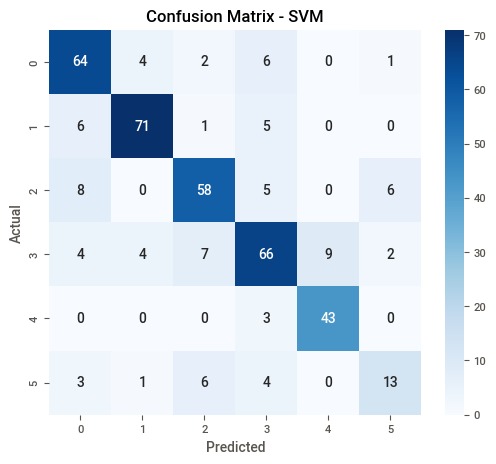

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(



Bagging SVM Accuracy: 0.7886
              precision    recall  f1-score   support

          C1       0.74      0.87      0.80        77
          C2       0.86      0.83      0.85        83
          C3       0.83      0.74      0.78        77
          C4       0.76      0.73      0.74        92
          C5       0.84      0.93      0.89        46
          C6       0.58      0.52      0.55        27

    accuracy                           0.79       402
   macro avg       0.77      0.77      0.77       402
weighted avg       0.79      0.79      0.79       402



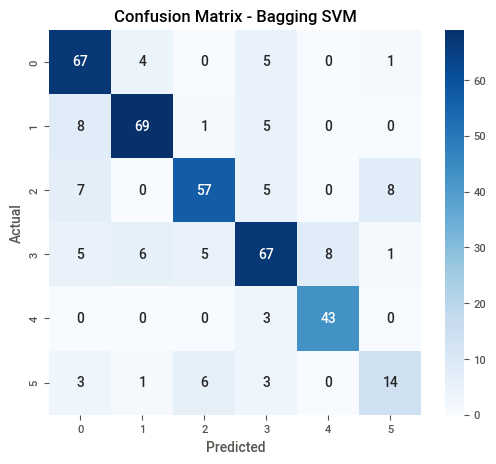


Logistic Regression Accuracy: 0.8060
              precision    recall  f1-score   support

          C1       0.82      0.88      0.85        77
          C2       0.88      0.88      0.88        83
          C3       0.82      0.81      0.81        77
          C4       0.74      0.73      0.73        92
          C5       0.80      0.89      0.85        46
          C6       0.72      0.48      0.58        27

    accuracy                           0.81       402
   macro avg       0.80      0.78      0.78       402
weighted avg       0.80      0.81      0.80       402



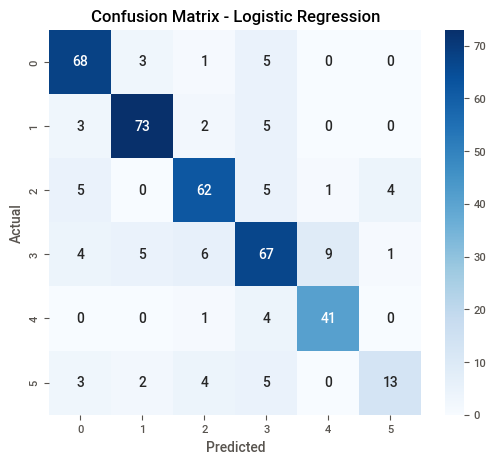


===== Training Models on X_pca Dataset =====
Training set: (1607, 94), Test set: (402, 94)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


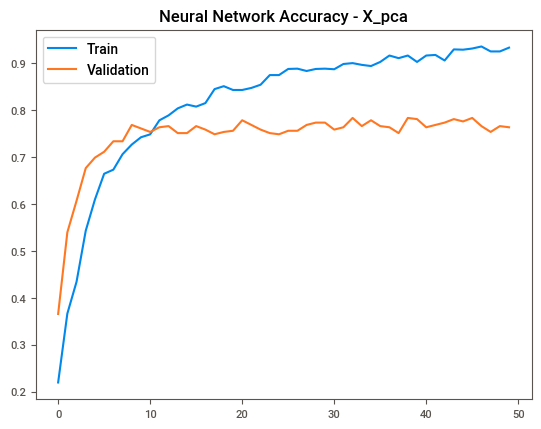

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step

Neural Network - X_pca Classification Report:
               precision    recall  f1-score   support

           0       0.74      0.69      0.71        77
           1       0.81      0.87      0.84        83
           2       0.79      0.70      0.74        77
           3       0.69      0.76      0.73        92
           4       0.88      0.91      0.89        46
           5       0.67      0.59      0.63        27

    accuracy                           0.76       402
   macro avg       0.76      0.75      0.76       402
weighted avg       0.76      0.76      0.76       402


Random Forest Accuracy: 0.7289
              precision    recall  f1-score   support

          C1       0.67      0.69      0.68        77
          C2       0.77      0.87      0.81        83
          C3       0.73      0.78      0.75        77
          C4       0.71      0.65      0.68        92
          C5       0.84      0.89      0.86        46
          C6 

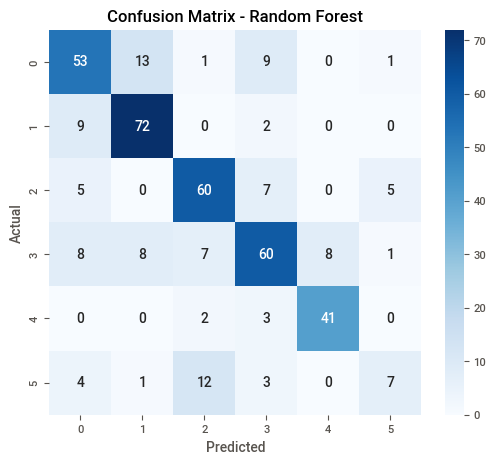

Best XGBoost Parameters for X_pca: {'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 200}

XGBoost Accuracy: 0.7463
              precision    recall  f1-score   support

          C1       0.67      0.71      0.69        77
          C2       0.82      0.81      0.81        83
          C3       0.77      0.78      0.77        77
          C4       0.74      0.70      0.72        92
          C5       0.86      0.93      0.90        46
          C6       0.48      0.41      0.44        27

    accuracy                           0.75       402
   macro avg       0.72      0.72      0.72       402
weighted avg       0.74      0.75      0.74       402



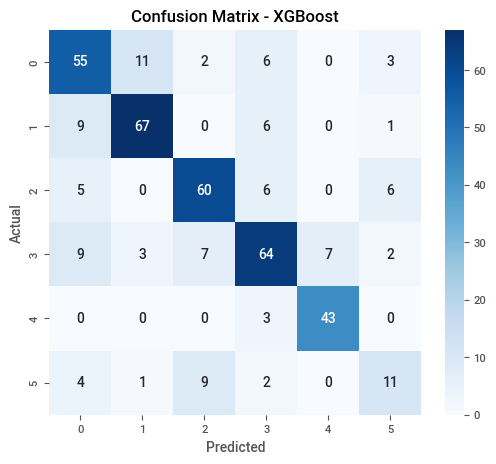

Fitting 3 folds for each of 150 candidates, totalling 450 fits
Best SVM Parameters for X_pca: {'C': 10, 'class_weight': None, 'gamma': 0.01, 'kernel': 'rbf'}

SVM Accuracy: 0.7736
              precision    recall  f1-score   support

          C1       0.73      0.77      0.75        77
          C2       0.86      0.86      0.86        83
          C3       0.85      0.68      0.75        77
          C4       0.70      0.79      0.74        92
          C5       0.89      0.91      0.90        46
          C6       0.54      0.52      0.53        27

    accuracy                           0.77       402
   macro avg       0.76      0.75      0.76       402
weighted avg       0.78      0.77      0.77       402



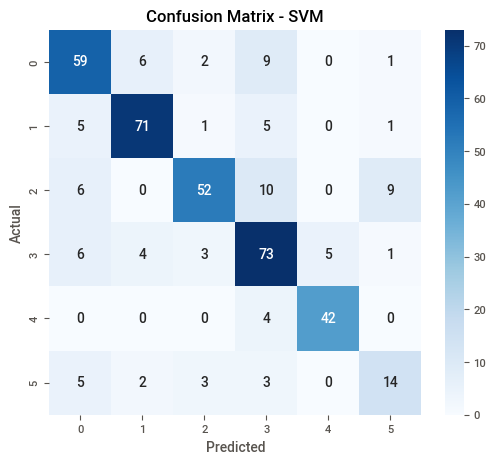

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(



Bagging SVM Accuracy: 0.7736
              precision    recall  f1-score   support

          C1       0.72      0.77      0.74        77
          C2       0.83      0.84      0.84        83
          C3       0.85      0.69      0.76        77
          C4       0.70      0.79      0.74        92
          C5       0.91      0.93      0.92        46
          C6       0.57      0.48      0.52        27

    accuracy                           0.77       402
   macro avg       0.76      0.75      0.76       402
weighted avg       0.78      0.77      0.77       402



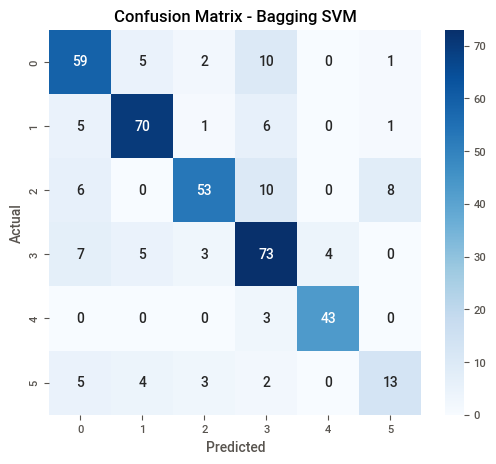


Logistic Regression Accuracy: 0.7836
              precision    recall  f1-score   support

          C1       0.74      0.73      0.73        77
          C2       0.84      0.89      0.87        83
          C3       0.79      0.79      0.79        77
          C4       0.75      0.75      0.75        92
          C5       0.86      0.93      0.90        46
          C6       0.63      0.44      0.52        27

    accuracy                           0.78       402
   macro avg       0.77      0.76      0.76       402
weighted avg       0.78      0.78      0.78       402



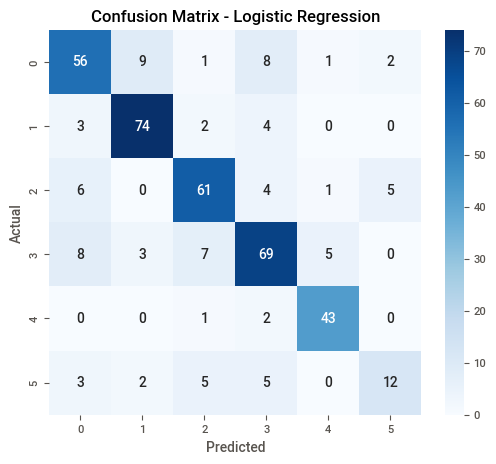


===== Training Models on X_kpca Dataset =====
Training set: (1607, 50), Test set: (402, 50)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


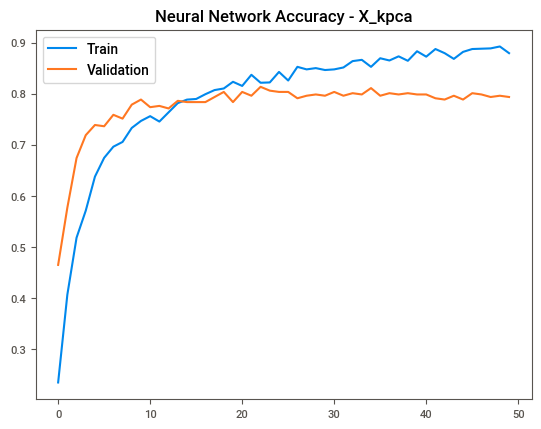

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step

Neural Network - X_kpca Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.82      0.81        77
           1       0.89      0.86      0.87        83
           2       0.84      0.74      0.79        77
           3       0.71      0.76      0.73        92
           4       0.81      0.93      0.87        46
           5       0.62      0.56      0.59        27

    accuracy                           0.79       402
   macro avg       0.78      0.78      0.78       402
weighted avg       0.80      0.79      0.79       402


Random Forest Accuracy: 0.7612
              precision    recall  f1-score   support

          C1       0.72      0.75      0.74        77
          C2       0.80      0.89      0.85        83
          C3       0.74      0.79      0.77        77
          C4       0.80      0.66      0.73        92
          C5       0.82      0.89      0.85        46
          C

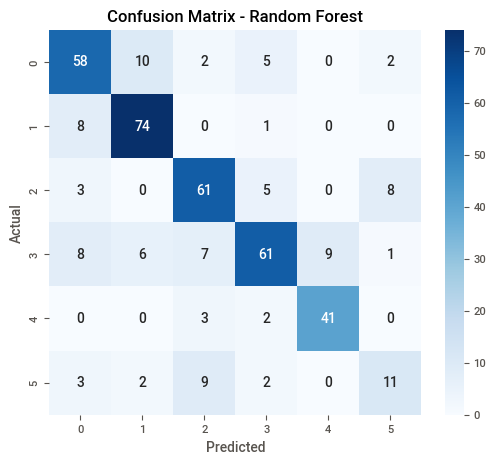

Best XGBoost Parameters for X_kpca: {'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 200}

XGBoost Accuracy: 0.7512
              precision    recall  f1-score   support

          C1       0.68      0.70      0.69        77
          C2       0.83      0.84      0.84        83
          C3       0.80      0.77      0.78        77
          C4       0.74      0.67      0.70        92
          C5       0.83      0.93      0.88        46
          C6       0.50      0.52      0.51        27

    accuracy                           0.75       402
   macro avg       0.73      0.74      0.73       402
weighted avg       0.75      0.75      0.75       402



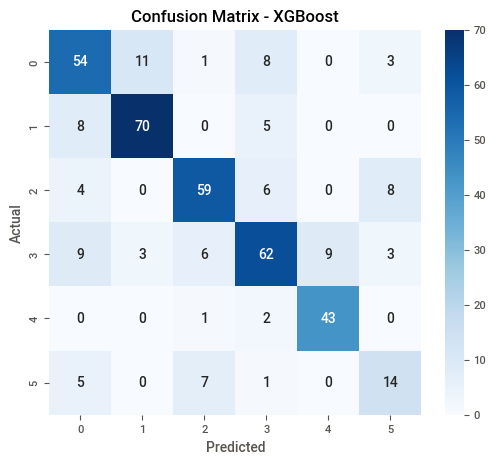

Fitting 3 folds for each of 150 candidates, totalling 450 fits
Best SVM Parameters for X_kpca: {'C': 50, 'class_weight': None, 'gamma': 0.001, 'kernel': 'rbf'}

SVM Accuracy: 0.7736
              precision    recall  f1-score   support

          C1       0.76      0.81      0.78        77
          C2       0.86      0.87      0.86        83
          C3       0.77      0.79      0.78        77
          C4       0.76      0.66      0.71        92
          C5       0.85      0.89      0.87        46
          C6       0.48      0.52      0.50        27

    accuracy                           0.77       402
   macro avg       0.75      0.76      0.75       402
weighted avg       0.77      0.77      0.77       402



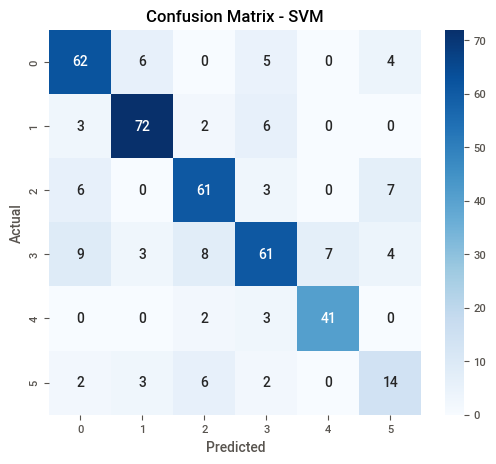

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(



Bagging SVM Accuracy: 0.7910
              precision    recall  f1-score   support

          C1       0.74      0.87      0.80        77
          C2       0.88      0.87      0.87        83
          C3       0.81      0.77      0.79        77
          C4       0.80      0.68      0.74        92
          C5       0.88      0.91      0.89        46
          C6       0.52      0.56      0.54        27

    accuracy                           0.79       402
   macro avg       0.77      0.78      0.77       402
weighted avg       0.79      0.79      0.79       402



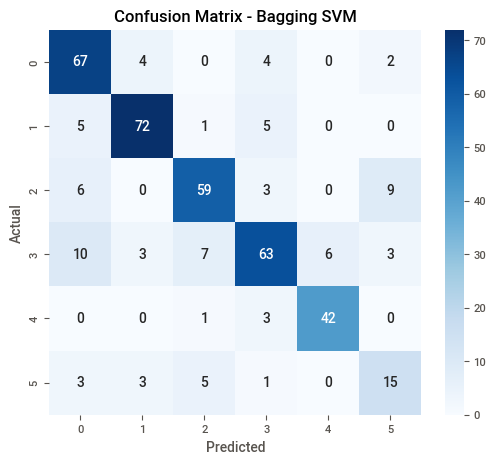


Logistic Regression Accuracy: 0.7960
              precision    recall  f1-score   support

          C1       0.76      0.74      0.75        77
          C2       0.84      0.93      0.88        83
          C3       0.84      0.81      0.82        77
          C4       0.76      0.72      0.74        92
          C5       0.86      0.91      0.88        46
          C6       0.64      0.59      0.62        27

    accuracy                           0.80       402
   macro avg       0.78      0.78      0.78       402
weighted avg       0.79      0.80      0.79       402



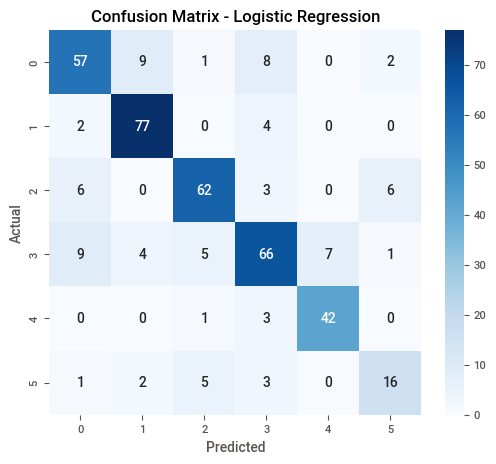


===== Training Models on X_nmf_100d Dataset =====
Training set: (1607, 100), Test set: (402, 100)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


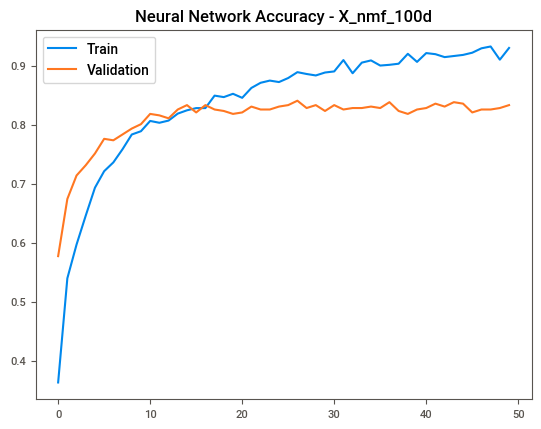

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step

Neural Network - X_nmf_100d Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.78      0.79        77
           1       0.94      0.89      0.91        83
           2       0.85      0.87      0.86        77
           3       0.75      0.83      0.79        92
           4       0.84      0.93      0.89        46
           5       0.83      0.56      0.67        27

    accuracy                           0.83       402
   macro avg       0.84      0.81      0.82       402
weighted avg       0.84      0.83      0.83       402


Random Forest Accuracy: 0.7861
              precision    recall  f1-score   support

          C1       0.74      0.77      0.75        77
          C2       0.80      0.94      0.86        83
          C3       0.78      0.78      0.78        77
          C4       0.80      0.79      0.80        92
          C5       0.87      0.89      0.88        46
        

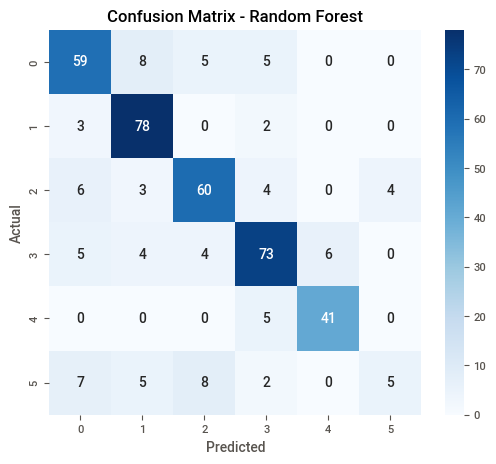

Best XGBoost Parameters for X_nmf_100d: {'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 200}

XGBoost Accuracy: 0.7935
              precision    recall  f1-score   support

          C1       0.76      0.81      0.78        77
          C2       0.85      0.90      0.88        83
          C3       0.76      0.78      0.77        77
          C4       0.80      0.75      0.78        92
          C5       0.84      0.93      0.89        46
          C6       0.62      0.37      0.47        27

    accuracy                           0.79       402
   macro avg       0.77      0.76      0.76       402
weighted avg       0.79      0.79      0.79       402



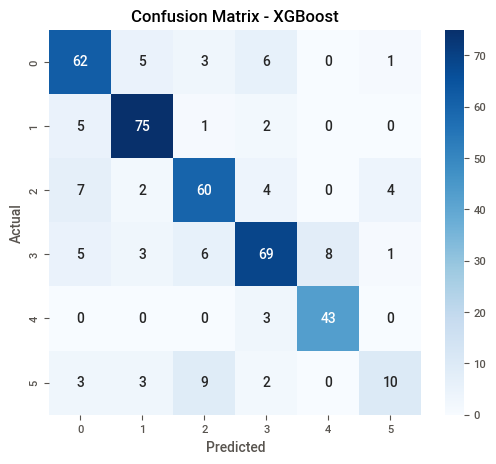

Fitting 3 folds for each of 150 candidates, totalling 450 fits
Best SVM Parameters for X_nmf_100d: {'C': 50, 'class_weight': 'balanced', 'gamma': 'auto', 'kernel': 'rbf'}

SVM Accuracy: 0.8035
              precision    recall  f1-score   support

          C1       0.79      0.77      0.78        77
          C2       0.85      0.92      0.88        83
          C3       0.81      0.81      0.81        77
          C4       0.80      0.76      0.78        92
          C5       0.83      0.93      0.88        46
          C6       0.62      0.48      0.54        27

    accuracy                           0.80       402
   macro avg       0.78      0.78      0.78       402
weighted avg       0.80      0.80      0.80       402



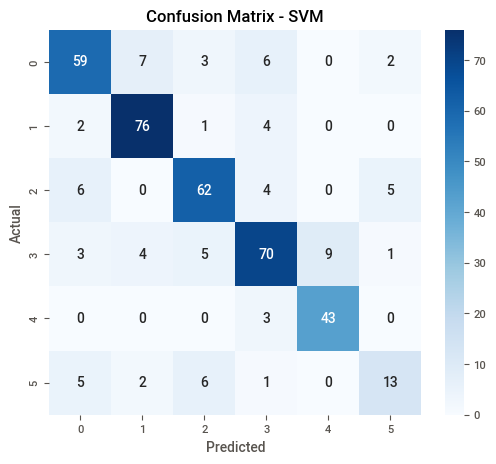

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(



Bagging SVM Accuracy: 0.8010
              precision    recall  f1-score   support

          C1       0.77      0.79      0.78        77
          C2       0.86      0.89      0.88        83
          C3       0.82      0.82      0.82        77
          C4       0.78      0.74      0.76        92
          C5       0.82      0.91      0.87        46
          C6       0.64      0.52      0.57        27

    accuracy                           0.80       402
   macro avg       0.78      0.78      0.78       402
weighted avg       0.80      0.80      0.80       402



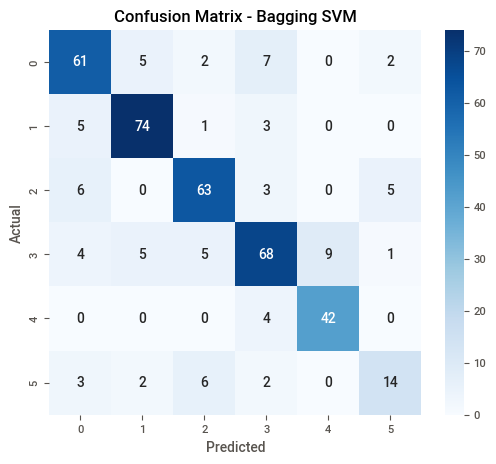


Logistic Regression Accuracy: 0.7985
              precision    recall  f1-score   support

          C1       0.81      0.83      0.82        77
          C2       0.89      0.92      0.90        83
          C3       0.77      0.78      0.77        77
          C4       0.76      0.75      0.75        92
          C5       0.84      0.93      0.89        46
          C6       0.50      0.33      0.40        27

    accuracy                           0.80       402
   macro avg       0.76      0.76      0.76       402
weighted avg       0.79      0.80      0.79       402



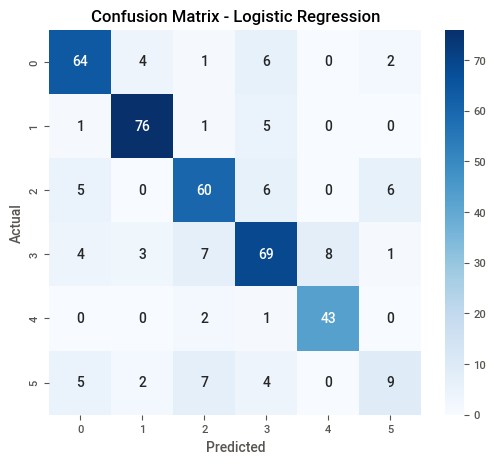


===== Training Models on X_full Dataset =====
Training set: (1607, 440), Test set: (402, 440)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


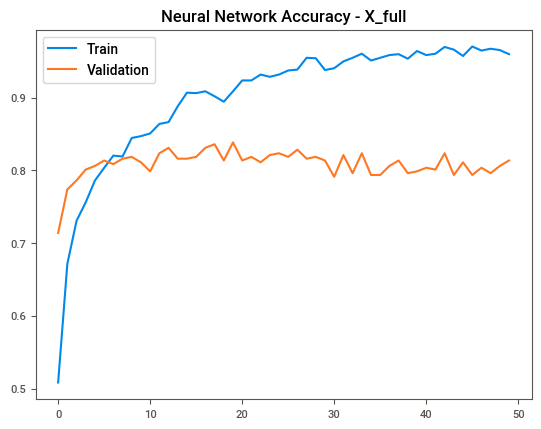

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step

Neural Network - X_full Classification Report:
               precision    recall  f1-score   support

           0       0.80      0.86      0.83        77
           1       0.88      0.86      0.87        83
           2       0.83      0.81      0.82        77
           3       0.78      0.79      0.79        92
           4       0.84      0.93      0.89        46
           5       0.60      0.44      0.51        27

    accuracy                           0.81       402
   macro avg       0.79      0.78      0.78       402
weighted avg       0.81      0.81      0.81       402


Random Forest Accuracy: 0.8035
              precision    recall  f1-score   support

          C1       0.80      0.84      0.82        77
          C2       0.84      0.92      0.88        83
          C3       0.78      0.77      0.77        77
          C4       0.81      0.74      0.77        92
          C5       0.90      0.93      0.91        46
          C6

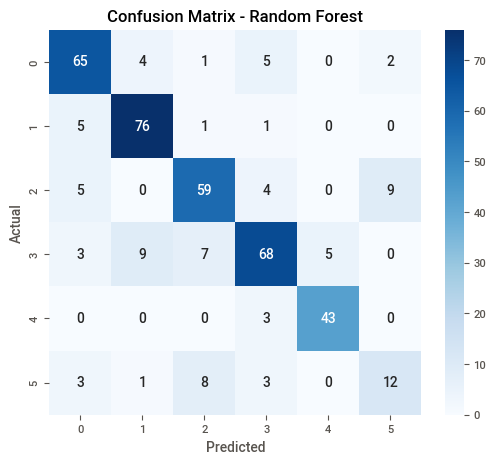

Best XGBoost Parameters for X_full: {'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 200}

XGBoost Accuracy: 0.8333
              precision    recall  f1-score   support

          C1       0.82      0.86      0.84        77
          C2       0.90      0.92      0.91        83
          C3       0.83      0.82      0.82        77
          C4       0.80      0.79      0.80        92
          C5       0.88      0.91      0.89        46
          C6       0.65      0.56      0.60        27

    accuracy                           0.83       402
   macro avg       0.81      0.81      0.81       402
weighted avg       0.83      0.83      0.83       402



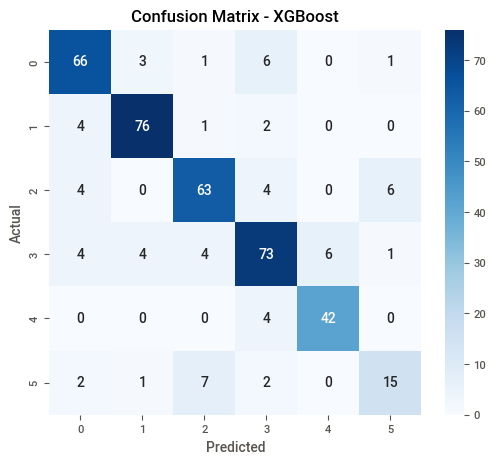

Fitting 3 folds for each of 150 candidates, totalling 450 fits
Best SVM Parameters for X_full: {'C': 10, 'class_weight': 'balanced', 'gamma': 'auto', 'kernel': 'rbf'}

SVM Accuracy: 0.8184
              precision    recall  f1-score   support

          C1       0.82      0.82      0.82        77
          C2       0.88      0.90      0.89        83
          C3       0.84      0.81      0.82        77
          C4       0.78      0.79      0.79        92
          C5       0.86      0.91      0.88        46
          C6       0.58      0.52      0.55        27

    accuracy                           0.82       402
   macro avg       0.79      0.79      0.79       402
weighted avg       0.82      0.82      0.82       402



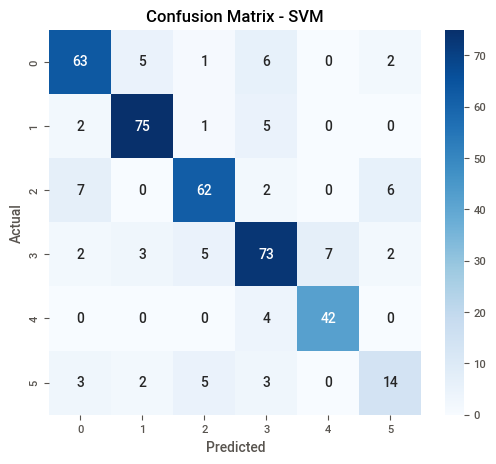

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(



Bagging SVM Accuracy: 0.8259
              precision    recall  f1-score   support

          C1       0.81      0.87      0.84        77
          C2       0.88      0.89      0.89        83
          C3       0.86      0.83      0.85        77
          C4       0.81      0.74      0.77        92
          C5       0.86      0.93      0.90        46
          C6       0.59      0.59      0.59        27

    accuracy                           0.83       402
   macro avg       0.80      0.81      0.81       402
weighted avg       0.83      0.83      0.82       402



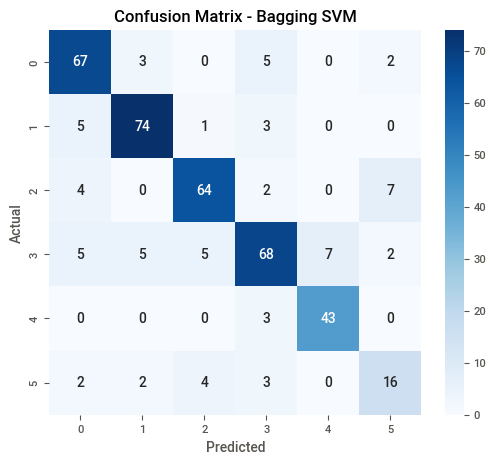

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(



Logistic Regression Accuracy: 0.7886
              precision    recall  f1-score   support

          C1       0.78      0.81      0.79        77
          C2       0.89      0.87      0.88        83
          C3       0.79      0.81      0.80        77
          C4       0.74      0.73      0.74        92
          C5       0.82      0.91      0.87        46
          C6       0.55      0.44      0.49        27

    accuracy                           0.79       402
   macro avg       0.76      0.76      0.76       402
weighted avg       0.79      0.79      0.79       402



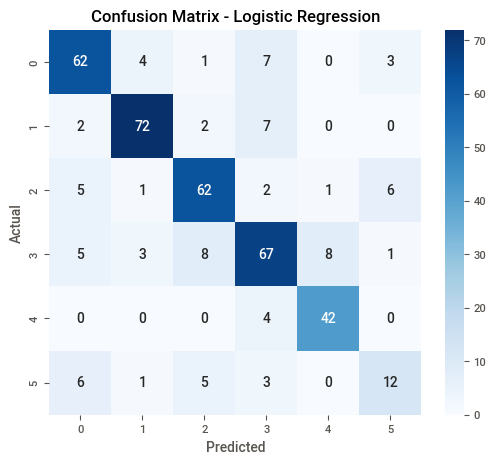


===== Training Models on X_tsne_3d Dataset =====
Training set: (1607, 3), Test set: (402, 3)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


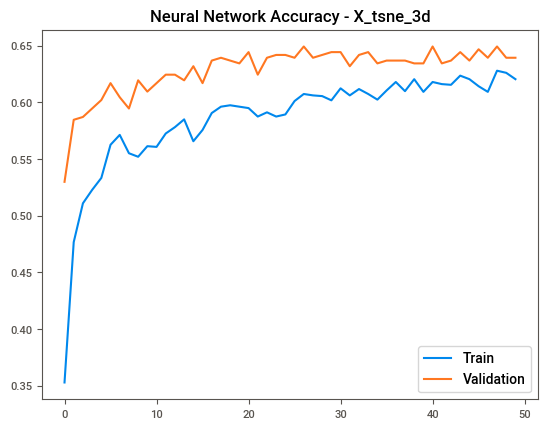

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step

Neural Network - X_tsne_3d Classification Report:
               precision    recall  f1-score   support

           0       0.61      0.60      0.61        77
           1       0.73      0.71      0.72        83
           2       0.57      0.61      0.59        77
           3       0.65      0.57      0.60        92
           4       0.84      0.89      0.86        46
           5       0.34      0.44      0.39        27

    accuracy                           0.64       402
   macro avg       0.62      0.64      0.63       402
weighted avg       0.65      0.64      0.64       402


Random Forest Accuracy: 0.7214
              precision    recall  f1-score   support

          C1       0.65      0.71      0.68        77
          C2       0.78      0.78      0.78        83
          C3       0.72      0.70      0.71        77
          C4       0.78      0.63      0.70        92
          C5       0.81      0.91      0.86        46
         

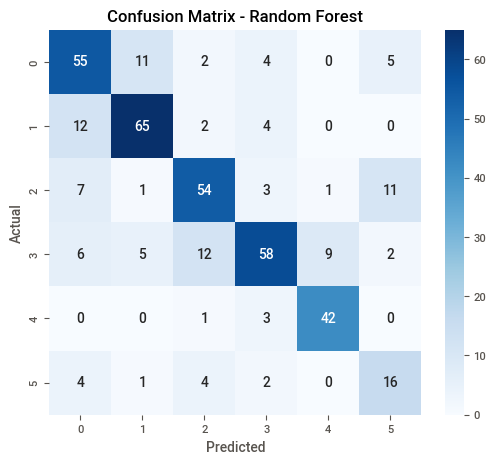

Best XGBoost Parameters for X_tsne_3d: {'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 200}

XGBoost Accuracy: 0.6244
              precision    recall  f1-score   support

          C1       0.59      0.53      0.56        77
          C2       0.69      0.63      0.66        83
          C3       0.60      0.65      0.62        77
          C4       0.65      0.57      0.60        92
          C5       0.81      0.91      0.86        46
          C6       0.34      0.52      0.41        27

    accuracy                           0.62       402
   macro avg       0.61      0.63      0.62       402
weighted avg       0.63      0.62      0.63       402



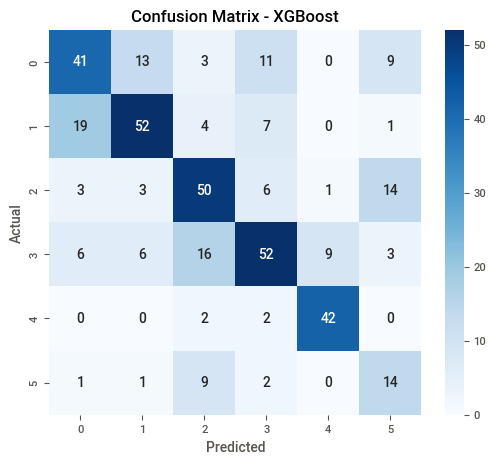

Fitting 3 folds for each of 150 candidates, totalling 450 fits
Best SVM Parameters for X_tsne_3d: {'C': 100, 'class_weight': None, 'gamma': 'auto', 'kernel': 'rbf'}

SVM Accuracy: 0.7065
              precision    recall  f1-score   support

          C1       0.67      0.75      0.71        77
          C2       0.75      0.75      0.75        83
          C3       0.68      0.65      0.66        77
          C4       0.76      0.63      0.69        92
          C5       0.84      0.91      0.87        46
          C6       0.44      0.52      0.47        27

    accuracy                           0.71       402
   macro avg       0.69      0.70      0.69       402
weighted avg       0.71      0.71      0.71       402



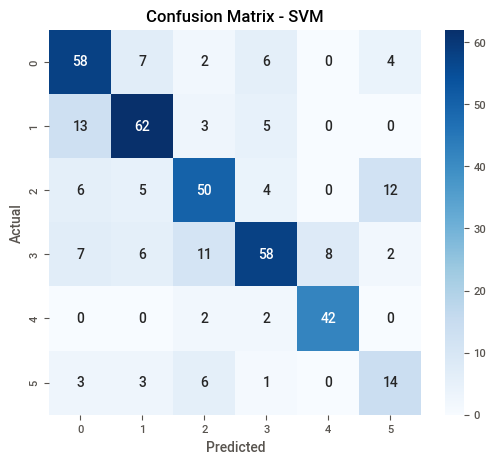

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(



Bagging SVM Accuracy: 0.6990
              precision    recall  f1-score   support

          C1       0.67      0.73      0.70        77
          C2       0.73      0.75      0.74        83
          C3       0.66      0.66      0.66        77
          C4       0.77      0.62      0.69        92
          C5       0.84      0.91      0.87        46
          C6       0.39      0.48      0.43        27

    accuracy                           0.70       402
   macro avg       0.68      0.69      0.68       402
weighted avg       0.71      0.70      0.70       402



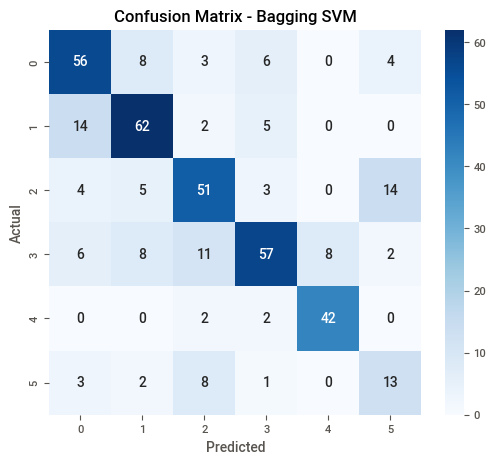


Logistic Regression Accuracy: 0.5224
              precision    recall  f1-score   support

          C1       0.57      0.56      0.56        77
          C2       0.55      0.63      0.59        83
          C3       0.46      0.48      0.47        77
          C4       0.38      0.39      0.38        92
          C5       0.78      0.91      0.84        46
          C6       0.00      0.00      0.00        27

    accuracy                           0.52       402
   macro avg       0.46      0.49      0.47       402
weighted avg       0.49      0.52      0.50       402



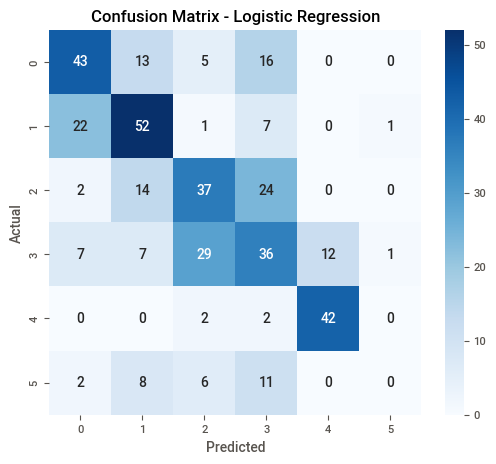

In [160]:


# Label Encoding
y = LabelEncoder().fit_transform(df_final_normalized['Immune Subtype'])

# PCA Transformation (90% Variance Retention)
#pca = PCA(n_components=0.90)
#X_pca = pca.fit_transform(X_full)
#X_FE=df_features.drop(columns=['Immune Subtype'])

# PCA and Kernel PCA
pca = PCA(n_components=0.90)
kpca = KernelPCA(n_components=50, kernel='rbf')
X_pca = pca.fit_transform(X_full)
X_kpca = kpca.fit_transform(X_full)
datasets = {
    "NMF": X_nmf,
    "X_pca": X_pca,
    "X_kpca": X_kpca,
    #"X_FE":X_FE,
   "X_nmf_100d": X_nmf_100d,
    #"tsne_100d": tsne_100d,
    "X_full": X_full,
   "X_tsne_3d": X_tsne_3d,
   # "Top_20_Correlated_Features": X_selected
}

# Scale Data
scaler = StandardScaler()

def train_and_evaluate_model(model, model_name, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    
    print(f'\n{model_name} Accuracy: {accuracy:.4f}')
    print(classification_report(y_test, y_pred, target_names=LabelEncoder().fit(df_final_normalized['Immune Subtype']).classes_))
    
    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix - {model_name}')
    plt.show()
    
    return accuracy

def create_nn(input_dim):
    model = Sequential([
        Dense(64, activation='relu', input_shape=(input_dim,)),
        Dropout(0.3),
        Dense(32, activation='relu'),
        Dropout(0.3),
        Dense(len(set(y)), activation='softmax')
    ])
    model.compile(optimizer=Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

results = {}

for name, X in datasets.items():
    print(f"\n===== Training Models on {name} Dataset =====")
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size=0.2, random_state=42)
    print(f"Training set: {X_train.shape}, Test set: {X_test.shape}")
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    
    # Neural Network Training
    nn_model = create_nn(X_train.shape[1])
    history = nn_model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=50, batch_size=16, verbose=0)
    
    plt.plot(history.history['accuracy'], label='Train')
    plt.plot(history.history['val_accuracy'], label='Validation')
    plt.title(f'Neural Network Accuracy - {name}')
    plt.legend()
    plt.show()
    
    y_pred_nn = nn_model.predict(X_test).argmax(axis=1)
    print(f"\nNeural Network - {name} Classification Report:\n", classification_report(y_test, y_pred_nn))
    
    # Random Forest Classifier
    rf_clf = RandomForestClassifier(n_estimators=200, max_depth=10, random_state=42)
    results[f"RandomForest_{name}"] = train_and_evaluate_model(rf_clf, "Random Forest", X_train, X_test, y_train, y_test)
    
    # XGBoost with Hyperparameter Tuning
    xgb_params = {'max_depth': [1,2], 'learning_rate': [0.01, 0.1], 'n_estimators': [100, 200]}
    xgb_clf = GridSearchCV(XGBClassifier(eval_metric='logloss', random_state=42), xgb_params, cv=3)
    xgb_clf.fit(X_train, y_train)
    print(f"Best XGBoost Parameters for {name}: {xgb_clf.best_params_}")
    results[f"XGBoost_{name}"] = train_and_evaluate_model(xgb_clf.best_estimator_, "XGBoost", X_train, X_test, y_train, y_test)
     # SVM with Hyperparameter Tuning
    svm_params = {
        'C': [0.1, 1, 10, 50, 100],
        'gamma': ['scale', 'auto', 0.001, 0.01, 0.1],
        'kernel': ['linear', 'rbf', 'poly'],
        'class_weight': ['balanced', None]
    }
    svm_clf = GridSearchCV(SVC(), svm_params, cv=3, verbose=1, n_jobs=-1)
    svm_clf.fit(X_train, y_train)
    print(f"Best SVM Parameters for {name}: {svm_clf.best_params_}")
    results[f"SVM_{name}"] = train_and_evaluate_model(svm_clf.best_estimator_, "SVM", X_train, X_test, y_train, y_test)
    
    # Bagging SVM
    bagging_svm = BaggingClassifier(base_estimator=SVC(**svm_clf.best_params_), n_estimators=10, random_state=42)

    results[f"BaggingSVM_{name}"] = train_and_evaluate_model(bagging_svm, "Bagging SVM", X_train, X_test, y_train, y_test)

    # Logistic Regression
    log_reg = LogisticRegression(max_iter=500)
    results[f"LogisticRegression_{name}"] = train_and_evaluate_model(log_reg, "Logistic Regression", X_train, X_test, y_train, y_test)





In [161]:
# Summary only 
print("\n===== Model Performance Summary =====")
for model, acc in results.items():
    print(f"{model}: {acc:.4f}")


===== Model Performance Summary =====
RandomForest_NMF: 0.7886
XGBoost_NMF: 0.8085
SVM_NMF: 0.7836
BaggingSVM_NMF: 0.7886
LogisticRegression_NMF: 0.8060
RandomForest_X_pca: 0.7289
XGBoost_X_pca: 0.7463
SVM_X_pca: 0.7736
BaggingSVM_X_pca: 0.7736
LogisticRegression_X_pca: 0.7836
RandomForest_X_kpca: 0.7612
XGBoost_X_kpca: 0.7512
SVM_X_kpca: 0.7736
BaggingSVM_X_kpca: 0.7910
LogisticRegression_X_kpca: 0.7960
RandomForest_X_nmf_100d: 0.7861
XGBoost_X_nmf_100d: 0.7935
SVM_X_nmf_100d: 0.8035
BaggingSVM_X_nmf_100d: 0.8010
LogisticRegression_X_nmf_100d: 0.7985
RandomForest_X_full: 0.8035
XGBoost_X_full: 0.8333
SVM_X_full: 0.8184
BaggingSVM_X_full: 0.8259
LogisticRegression_X_full: 0.7886
RandomForest_X_tsne_3d: 0.7214
XGBoost_X_tsne_3d: 0.6244
SVM_X_tsne_3d: 0.7065
BaggingSVM_X_tsne_3d: 0.6990
LogisticRegression_X_tsne_3d: 0.5224



### **2.1 Model Selection and Training**

Partitioned the pre-processed dataset into **training (80%)** and **test (20%)** sets using **stratified sampling**, ensuring balanced class distributions. Below are the dataset dimensions:


In [172]:

X_train.shape, X_test.shape


((1607, 440), (402, 440))


Experimented with multiple classification algorithms to assess their performance on the dataset:

- **Random Forest Classifier**
- **XGBoost Classifier**
- **Support Vector Machine (SVM)**
- **Bagging Classifier with SVM**
- **Logistic Regression**
- **Neural Networks (Feedforward NN)**

Each model was trained on multiple feature representations, including **PCA-transformed, Kernel PCA, NMF, t-SNE, and the full feature set.** The goal was to determine the best feature space for classification.

### **2.2 Optimal Model Development**

To enhance model performance, we applied **hyperparameter tuning** via **GridSearchCV** and **cross-validation (k=3)**:

#### **XGBoost Hyperparameter Tuning**
```python
param_grid = {
    'max_depth': [1, 2],
    'learning_rate': [0.01, 0.1],
    'n_estimators': [100, 200]
}
```
- Evaluated different combinations using **log-loss** as the evaluation metric.
- Selected the best hyperparameters for each dataset.

#### **SVM Hyperparameter Tuning**
```python
param_grid = {
    'C': [0.1, 1, 10, 50, 100],
    'gamma': ['scale', 'auto', 0.001, 0.01, 0.1],
    'kernel': ['linear', 'rbf', 'poly'],
    'class_weight': ['balanced', None]
}
```
- Optimized kernel selection, regularization (`C`), and gamma values for non-linear decision boundaries.

#### **Neural Network Training**
- Implemented a **Feedforward Neural Network (FNN)** with dropout for regularization.
- Configured layers as follows:
```python
model = Sequential([
    Dense(64, activation='relu', input_shape=(input_dim,)),
    Dropout(0.3),
    Dense(32, activation='relu'),
    Dropout(0.3),
    Dense(len(set(y)), activation='softmax')
])
```
- Used **Adam optimizer (learning rate = 0.001)** and **sparse categorical cross-entropy** as the loss function.

### **2.3 Justification of the Selected Methods**

The chosen models align with the dataset's complexity:

- **Random Forest & XGBoost:** Robust against outliers and handle feature importance well.
- **SVM:** Effective for high-dimensional data, especially with kernel tricks.
- **Bagging Classifier:** Combines multiple weak learners (SVM) to enhance performance.
- **Neural Networks:** Captures non-linear relationships in the dataset, suitable for complex patterns.

Feature engineering was crucial, with **PCA and NMF improving model performance** by reducing redundancy in features.

### **2.4 Strategies to Address Model Issues**

Several strategies were implemented to enhance model generalization and robustness:

- **Class Imbalance Handling:** Applied stratified sampling and `class_weight='balanced'` in models like SVM.
- **Regularization:** Used dropout in NN and `max_depth` tuning in XGBoost to prevent overfitting.
- **Feature Selection:** Evaluated different feature reduction techniques (PCA, NMF, t-SNE) to improve interpretability.
- **Cross-validation:** Ensured models generalize well across different data splits.
The following table summarizes the accuracy results obtained for different models and dimensionality reduction techniques:

| Model | NMF | PCA | Kernel PCA | NMF (100D) | Full Dataset | t-SNE (3D) |
|--------|------|------|------------|-------------|--------------|------------|
| **Random Forest** | 0.7886 | 0.7289 | 0.7612 | 0.7861 | 0.8035 | 0.7214 |
| **XGBoost** | 0.8085 | 0.7463 | 0.7512 | 0.7935 | **0.8333** | 0.6244 |
| **SVM** | 0.7836 | 0.7736 | 0.7736 | 0.8035 | 0.8184 | 0.7065 |
| **Bagging SVM** | 0.7886 | 0.7736 | 0.7910 | 0.8010 | 0.8259 | 0.6990 |
| **Logistic Regression** | 0.8060 | 0.7836 | 0.7960 | 0.7985 | 0.7886 | 0.5224 |


## Conclusion

The best-performing model was **XGBoost on the full dataset with an accuracy of 83.33%**. Further improvements could be explored using advanced ensemble techniques or deep learning approaches.



# Section 3- Model Evaluation 



---

## **Model Definition and Tuning**

We used the XGBoost classifier with hyperparameter tuning via GridSearchCV.  
The best parameters for the full dataset (using `X_full`) were:

- **Learning Rate:** 0.1  
- **Max Depth:** 2  
- **Number of Estimators:** 200  

After scaling the data and splitting into training and test sets, the model was fit on the training data and predictions were generated on the test set.

---

## **Model Performance Metrics**  




## **Classification Report**

| Class | Precision | Recall | F1-Score | Support |
|-------|-----------|--------|----------|---------|
| **C1** (Wound Healing)  | 0.82  | 0.86  | 0.84  | 77  |
| **C2** (IFN-γ Dominant)  | 0.90  | 0.92  | 0.91  | 83  |
| **C3** (Inflammatory)  | 0.83  | 0.82  | 0.82  | 77  |
| **C4** (Lymphocyte Depleted)  | 0.80  | 0.79  | 0.80  | 92  |
| **C5** (Immunologically Quiet)  | 0.88  | 0.91  | 0.89  | 46  |
| **C6** (TGF-β Dominant)  | 0.65  | 0.56  | 0.60  | 27  |

### **Overall Model Performance**
- **Accuracy:** 83%  
- **Total Samples:** 402  



---

## **Model Performance Analysis**

### **Overall Performance**  

- **Accuracy:** The overall model accuracy is **83.33%**, meaning that the classifier correctly labels the majority of samples.  
- **Macro and Weighted Averages:** With a **macro average of ~81%** and a **weighted average of 83%**, performance is reasonably balanced across classes.  

---

### **Per-Class Performance & Implications**  

#### **1. C1 (Wound Healing)**
- **Metrics:** Precision = 0.82, Recall = 0.86, F1-Score = 0.84  
- **Implications:**  
  High recall indicates that most true C1 cases are captured. The slightly lower precision shows that a few samples may be incorrectly predicted as C1.  
  - *Reason:* C1 tumors are defined by distinct angiogenic and proliferation signatures, which aids their identification.

#### **2. C2 (IFN-γ Dominant)**
- **Metrics:** Precision = 0.90, Recall = 0.92, F1-Score = 0.91  
- **Implications:**  
  With the highest scores among the subtypes, C2 tumors are classified exceptionally well.  
  - *Reason:* Strong CD8+ T cell signals and robust M1 macrophage polarization provide a distinct signature, making them easier to classify.

#### **3. C3 (Inflammatory)**
- **Metrics:** Precision = 0.83, Recall = 0.82, F1-Score = 0.82  
- **Implications:**  
  Balanced performance suggests that while the inflammatory markers (Th1/Th17) are distinct, there is some overlap with other classes.  
  - *Reason:* Some cases may be misclassified as **C1 (Wound Healing)** if angiogenic signals are moderate.

#### **4. C4 (Lymphocyte Depleted)**
- **Metrics:** Precision = 0.80, Recall = 0.79, F1-Score = 0.80  
- **Implications:**  
  Performance metrics indicate some misclassification, especially in borderline cases.  
  - *Reason:* High M2 macrophage signal and suppressed Th1 response make it similar to **C6 (TGF-β Dominant)**.

#### **5. C5 (Immunologically Quiet)**
- **Metrics:** Precision = 0.88, Recall = 0.91, F1-Score = 0.89  
- **Implications:**  
  With high precision and recall, C5 samples are well distinguished.  
  - *Reason:* Low lymphocyte and high M2 macrophage features provide a clear signal, making these cases easier to classify.

#### **6. C6 (TGF-β Dominant)**
- **Metrics:** Precision = 0.65, Recall = 0.56, F1-Score = 0.60  
- **Implications:**  
  C6 is the most challenging class. The low recall indicates that many true C6 samples are missed, and the low precision suggests a considerable number of false positives.  
  - *Reason:*  
    - **Heterogeneity:** TGF-β Dominant tumors have variable expression and are not restricted to a single cancer type.  
    - **Overlapping Features:** Some samples with moderate TGF-β signaling may also exhibit characteristics of **C4 (Lymphocyte Depleted)**, leading to misclassification.  
    - **Small Sample Size:** With only 27 instances, statistical noise can significantly affect model performance.  

---

## **Examples of Misclassification and Potential Reasons**

### **1. C6 vs. C4**
- **False Negatives:** A true C6 sample might be misclassified as **C4** if it exhibits a strong M2 macrophage signature and only moderate TGF-β expression.  
- **False Positives:** Some samples predicted as C6 may not be true TGF-β Dominant cases if they show borderline TGF-β signals, resulting in lower precision.

### **2. C1 vs. C3 Overlap**
- **Borderline Cases:** A sample with features of both **wound healing (C1)** and **inflammatory responses (C3)** might be misclassified.  
  - Example: A C1 sample with less prominent angiogenic signals could be predicted as C3 if inflammatory markers are more pronounced.

### **3. C4 vs. C6 Misclassification**
- **Subtle Differences:** The misclassification between these two subtypes emphasizes the subtle differences in their immune microenvironment.  
- **Example:** A sample with moderate TGF-β signaling might be more readily confused with C4 if the overall immune suppression is similar.

---

## **Summary**  

The XGBoost model achieved an overall accuracy of **83.33%** on the full dataset, with distinct performance across the six immune subtypes.  

- The best performance was observed in **C2 (IFN-γ Dominant)** and **C5 (Immunologically Quiet)**, owing to their well-defined and robust immune signatures.  
- In contrast, **C6 (TGF-β Dominant)** posed challenges due to:  
  - Its heterogeneous nature  
  - Overlapping features with C4  
  - Limited sample size  

Specific misclassifications—such as **C6 being confused with C4** and occasional overlaps between **C1 and C3**—highlight the complexity of the tumor immune landscape as described in **Thorsson et al. (2018).**  

---

## **References**
- **Thorsson et al.,** "The Immune Landscape of Cancer" (2018)  
